# Articles, Videos, Papers, Repositories:
* SQL window functions: https://www.youtube.com/watch?v=Ww71knvhQ-s&pp=ygUUc3FsIHdpbmRvdyBmdW5jdGlvbnM%3D
* Projects to emulate:
- https://www.startdataengineering.com/post/data-engineering-project-for-beginners-batch-edition/#1-introduction
- https://www.ssp.sh/blog/data-engineering-project-in-twenty-minutes/
* start DE free cousrse: https://github.com/josephmachado/sde_de101_josephmachado/tree/main
* data engineering 101 #2 - sql is crucial for data engineers
* data engineering 101 #4 - best practices: 
- https://www.startdataengineering.com/post/de_best_practices/
- data_engineering_best_practices repository


# To do:
* open bank account since it is more important than ever to have an atm card in order to use your account number for use of free tier cloud services like AWS, azure, and gcp, data warehousing platforms like snowflake

# Typical File Structure of Data Engineering Project Template from Joseph Machado https://github.com/josephmachado/beginner_de_project.git:
```
|- containers
    |- airflow
        |- Dockerfile
        |- quarto.sh
        |- requirements.txt
        |- setup_conn.py
    |- upstream
        |- 1-create-user-purchase.sql
|- dags
    |- scripts
        |- dashboard.html
        |- dashboard.qmd
    |- spark
        |- random_text_classification.py
    |- user_analytics.py
|- data
    |- behaviour_metrics.csv
    |- movie_review.csv
    |- OnlineRetail.csv
|- logs
|- plugins
|- temp
|- tests
    |- dags
        |- test_dag_validity.py
|- .gitignore
|- .dockerignore
|- .env
|- docker-compose.yml
|- Makefile
```

In [45]:
import os
from IPython.display import Image
from IPython.core.display import display

C:\Users\LARRY\AppData\Local\Temp\ipykernel_7680\1904344699.py:3: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
  from IPython.core.display import display


In [46]:
dir = "./assets/"
img_files = os.listdir(dir)
imgs = [Image(filename=os.path.join(dir, img_file), width=1000, height=1000) for img_file in img_files]
len(imgs)

49

# Insights:
* Data orchestration uses apache airflow which schedules jobs at a specific cadence for tasks like data ingestion, processing, and transformation
* Skim through these documentation quickly to get a high level overview
AWS S3: https://aws.amazon.com/s3/
PostgreSQL: https://www.postgresql.org/docs/
Airflow: https://airflow.apache.org/docs/apache-airflowtable/core-concepts/index.html
Project idea: Create an Airflow DAG that extracts data from your favorite source (nance, sports, music) and
uploads it to a Data Warehouse (any relational database of your choice)

* Batch processing is just a toolframework to manage growing data and enable us to process them in a scalable manner. Scalable means simply that: a software can handle increased workloads, such as more users or larger datasets, while maintaining performance, a sofware can easily add or remove resources to meet changing demands, and a software remains stable and maintains performance even after a sudden increase in workload. 

-----

* So far I see from the data engineering project template from Joseph Machado that make files are common which maybe house commands to run docker files
```
####################################################################################################################
# Setup containers to run Airflow

docker-spin-up:
	docker compose build && docker compose up airflow-init && docker compose up --build -d 

perms:
	sudo mkdir -p logs plugins temp dags tests data visualization && sudo chmod -R u=rwx,g=rwx,o=rwx logs plugins temp dags tests data visualization

setup-conn:
	docker exec scheduler python /opt/airflow/setup_conn.py

do-sleep:
	sleep 30

up: perms docker-spin-up do-sleep setup-conn

down:
	docker compose down

restart: down up

sh:
	docker exec -ti webserver bash

####################################################################################################################
# Testing, auto formatting, type checks, & Lint checks
pytest:
	docker exec webserver pytest -p no:warnings -v /opt/airflow/tests

format:
	docker exec webserver python -m black -S --line-length 79 .

isort:
	docker exec webserver isort .

type:
	docker exec webserver mypy --ignore-missing-imports /opt/airflow

lint: 
	docker exec webserver flake8 /opt/airflow/dags

ci: isort format type lint pytest
```

running `make up` in the directory that contains this `Makefile` will somehow run the command under the `up` statement idk if that's how you say it but under `up:` it which is `perms docker-spin-up do-sleep setup-conn`

-----

* there are basically two ways to define tasks in Airflow one by using the `<Task e.g. Bash, Python, S3CreateBucket, LocalFilesystemToS3, SqlToS3>Operator`
* And this is how we sequentially execute tasks by using the `>>` operator and placing each task that should go first and then proceeding it the next task/operator and so on since we created an operator using the `S3CreateBucketOperator` class the object created from it is what we use as the task to be used with the `>>` operator then preceding it 

**Example 1:**
```
# Tasks are represented as operators
hello = BashOperator(task_id="hello", bash_command="echo hello")

@task()
def airflow():
    print("airflow")

# Set dependencies between tasks
hello >> airflow()
```

**Example 2:**
```
create_s3_bucket >> [user_purchase_to_s3, movie_review_to_s3]

user_purchase_to_s3 >> get_user_purchase_to_warehouse

movie_review_to_s3 >> movie_classifier >> get_movie_review_to_warehouse

(
    [get_user_purchase_to_warehouse, get_movie_review_to_warehouse]
    >> get_user_behaviour_metric
    >> gen_dashboard
)
```

-----

* Airflow was not built for infinitely running event-based workflows, like when an event such as a user uploading a file online airflow will not trigger a workflow when this event happens. Other frameworks like Apache 

-----

* installing airflow via `pip`
`pip install "apache-airflow[celery]==2.10.4" --constraint "https://raw.githubusercontent.com/apache/airflow/constraints-2.10.4/constraints-3.8.txt"`
`pip install "apache-airflow==2.10.4"`
we also keep a set of constraint files in the constraints-main, constraints-2-0, constraints-2-1 etc. orphan branches and then we create a 
tag for each released version e.g. constraints-2.10.4
`https://raw.githubusercontent.com/apache/airflow/constraints-${AIRFLOW_VERSION}/constraints-${PYTHON_VERSION}.txt`
where:
`AIRFLOW_VERSION` - Airflow version (e.g. `2.10.4`) or `main`, `2-0`, for latest development version
`PYTHON_VERSION` - Python version e.g. 3.8, 3.9

-----

* the key and value pairs in the default args of the DAG (directed acyclic graph) object are all used by the operators/tasks you define. E.g. when your default args include an `execution_timeout` and `timedelta(seconds=300)` key value pair, this means that if we define a `BashOperator` task if we don't try to override its execution_timeout argument with a new value or a new timedelta value e.g. `BashOperator(execution_timeout=timedelta(seconds=10))` then the default value of this `execution_timeout` arg which is `timedelta(seconds=300)` will instead be used
* One thing to wrap your head around (it may not be very intuitive for everyone at first) is that this Airflow Python script is really just a configuration file specifying the DAG’s structure as code.
* People sometimes think of the DAG definition file as a place where they can do some actual data processing - that is not the case. The script’s purpose is to define a DAG object
* An Airflow pipeline is just a Python script that happens to define an Airflow DAG object

```
import textwrap
from datetime import datetime, timedelta

# The DAG object; we'll need this to instantiate a DAG
from airflow.models.dag import DAG

# Operators; we need this to operate!
from airflow.operators.bash import BashOperator
with DAG(
    "tutorial",
    # These args will get passed on to each operator
    # You can override them on a per-task basis during operator initialization
    default_args={
        "depends_on_past": False,
        "email": ["airflow@example.com"],
        "email_on_failure": False,
        "email_on_retry": False,
        "retries": 1,
        "retry_delay": timedelta(minutes=5),
        # 'queue': 'bash_queue',
        # 'pool': 'backfill',
        # 'priority_weight': 10,
        # 'end_date': datetime(2016, 1, 1),
        # 'wait_for_downstream': False,
        # 'sla': timedelta(hours=2),
        # 'execution_timeout': timedelta(seconds=300),
        # 'on_failure_callback': some_function, # or list of functions
        # 'on_success_callback': some_other_function, # or list of functions
        # 'on_retry_callback': another_function, # or list of functions
        # 'sla_miss_callback': yet_another_function, # or list of functions
        # 'on_skipped_callback': another_function, #or list of functions
        # 'trigger_rule': 'all_success'
    },
    description="A simple tutorial DAG",
    schedule=timedelta(days=1),
    start_date=datetime(2021, 1, 1),
    catchup=False,
    tags=["example"],
) as dag:

    # t1, t2 and t3 are examples of tasks created by instantiating operators
    t1 = BashOperator(
        task_id="print_date",
        bash_command="date",
    )

    t2 = BashOperator(
        task_id="sleep",
        depends_on_past=False,
        bash_command="sleep 5",
        retries=3,
    )
    t1.doc_md = textwrap.dedent(
        """\
    #### Task Documentation
    You can document your task using the attributes `doc_md` (markdown),
    `doc` (plain text), `doc_rst`, `doc_json`, `doc_yaml` which gets
    rendered in the UI's Task Instance Details page.
    ![img](https://imgs.xkcd.com/comics/fixing_problems.png)
    **Image Credit:** Randall Munroe, [XKCD](https://xkcd.com/license.html)
    """
    )

    dag.doc_md = __doc__  # providing that you have a docstring at the beginning of the DAG; OR
    dag.doc_md = """
    This is a documentation placed anywhere
    """  # otherwise, type it like this
    templated_command = textwrap.dedent(
        """
    {% for i in range(5) %}
        echo "{{ ds }}"
        echo "{{ macros.ds_add(ds, 7)}}"
    {% endfor %}
    """
    )

    t3 = BashOperator(
        task_id="templated",
        depends_on_past=False,
        bash_command=templated_command,
    )

    t1 >> [t2, t3]
```

### Below are examples on how the script user_analytics.py defines a DAG object and how airflow visualizes it through its UI

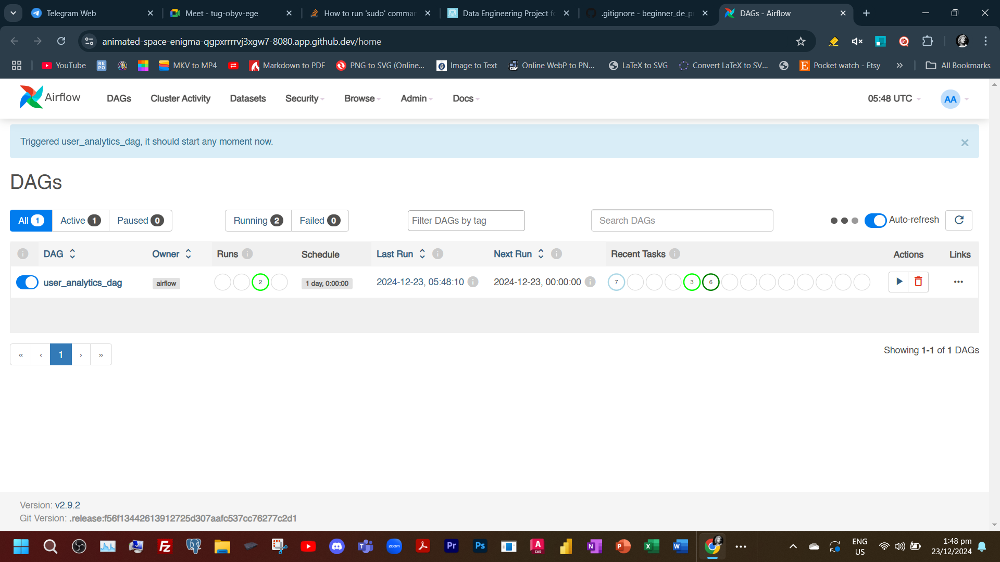

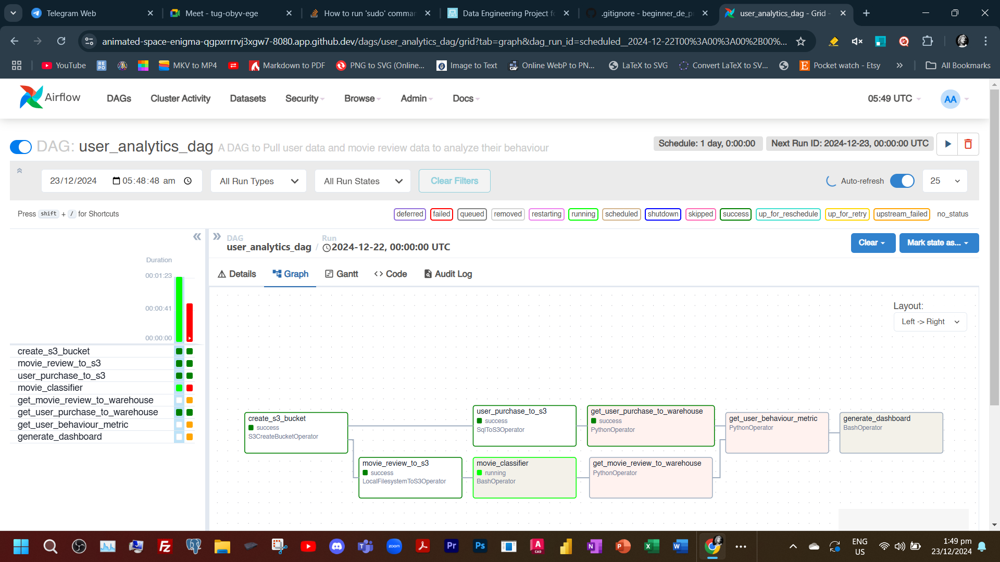

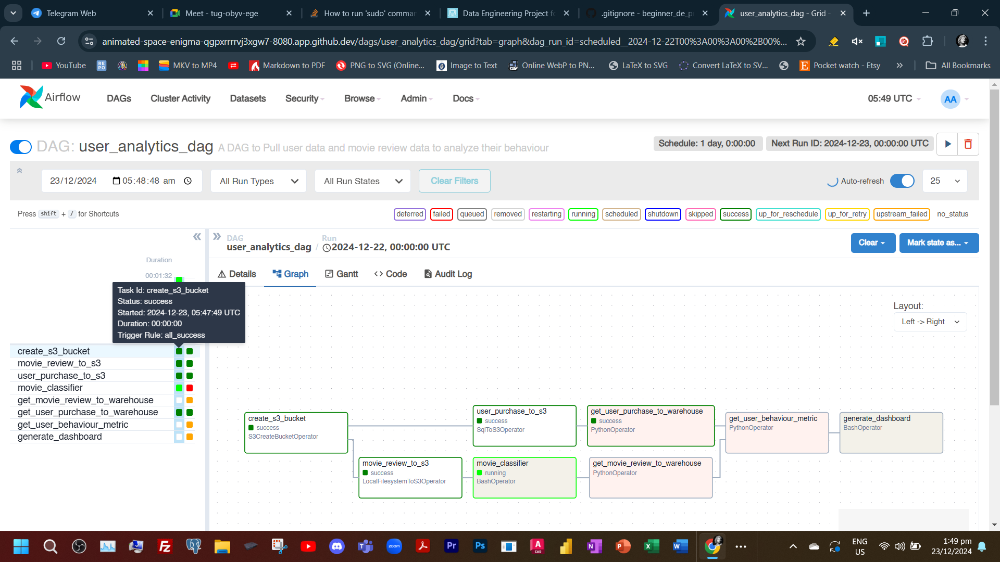

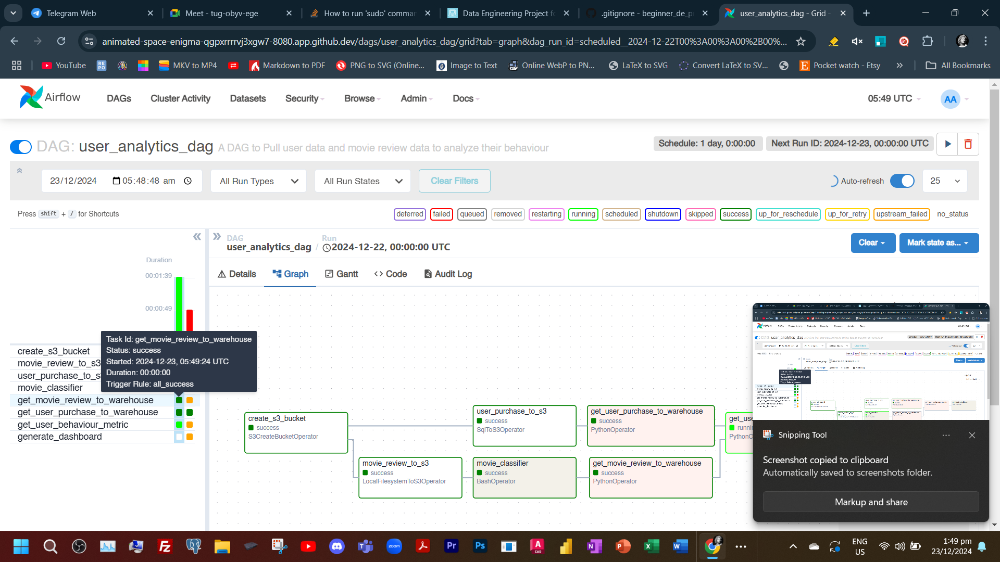

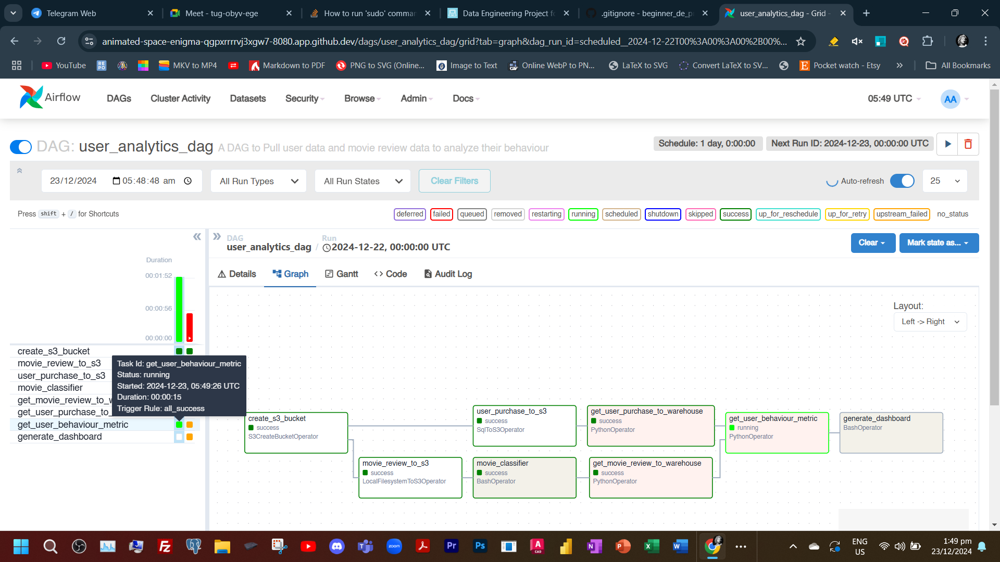

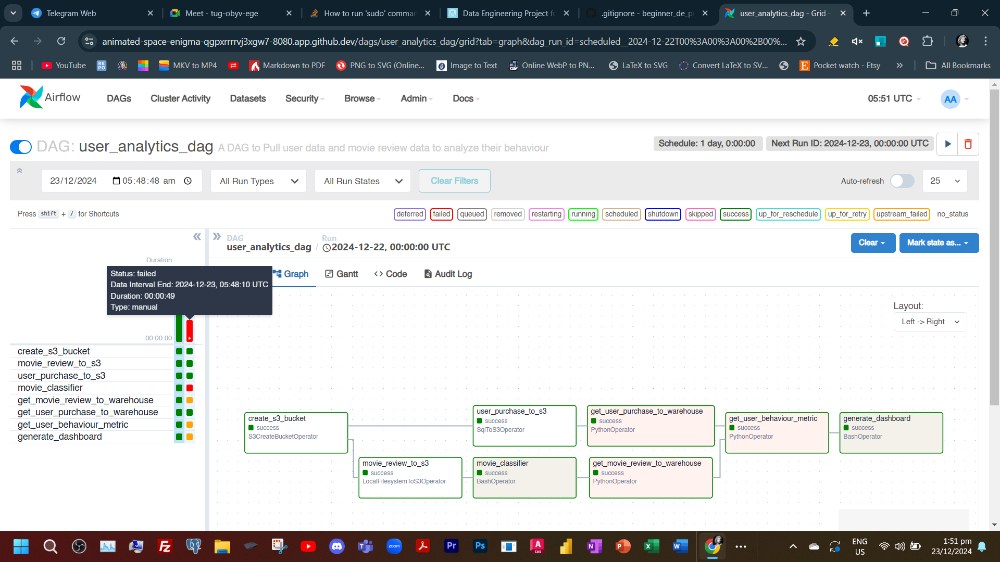

In [47]:
display(imgs[36])
display(imgs[37])
display(imgs[38])
display(imgs[39])
display(imgs[40])
display(imgs[41])

-----

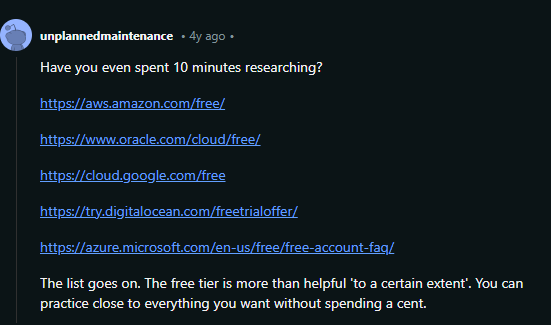

In [48]:
display(imgs[0])

#### This seems to be the airflow UI but I wonder is apache airflow paid?

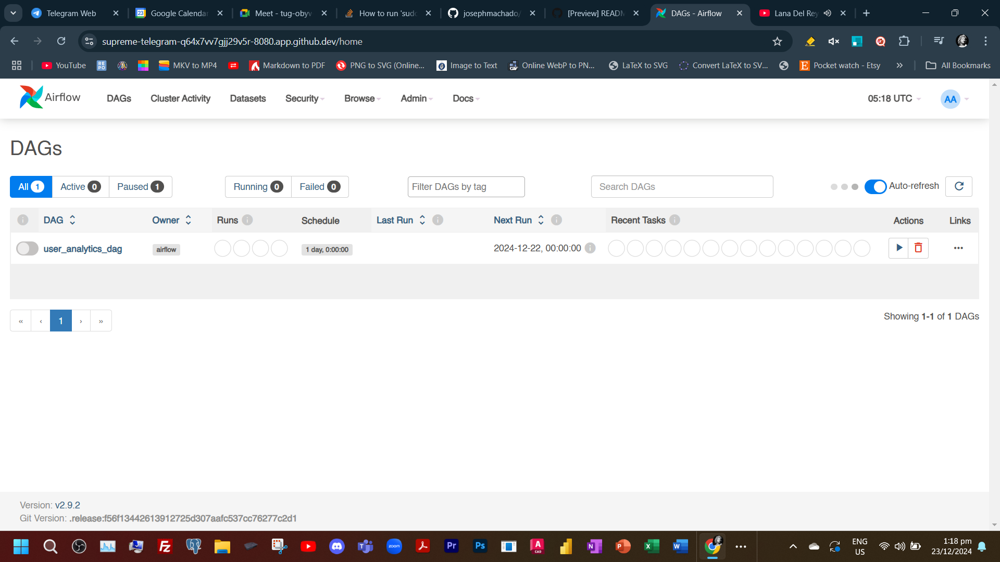

In [49]:
display(imgs[1])

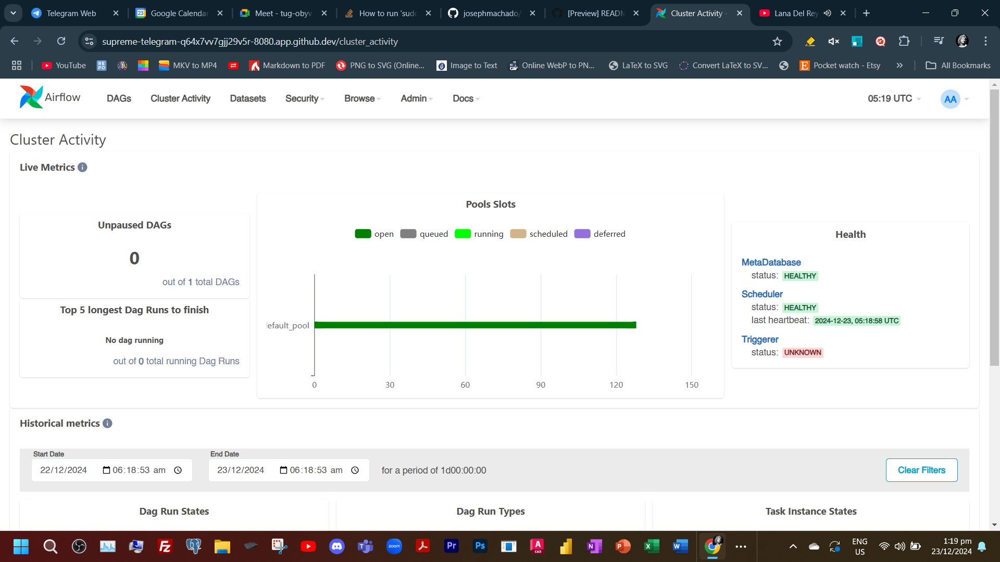

In [50]:
display(imgs[2])

#### this is when we click on the cluster activity tab. Idk still what this shows or represents maybe the database where we pulled data from idk? 

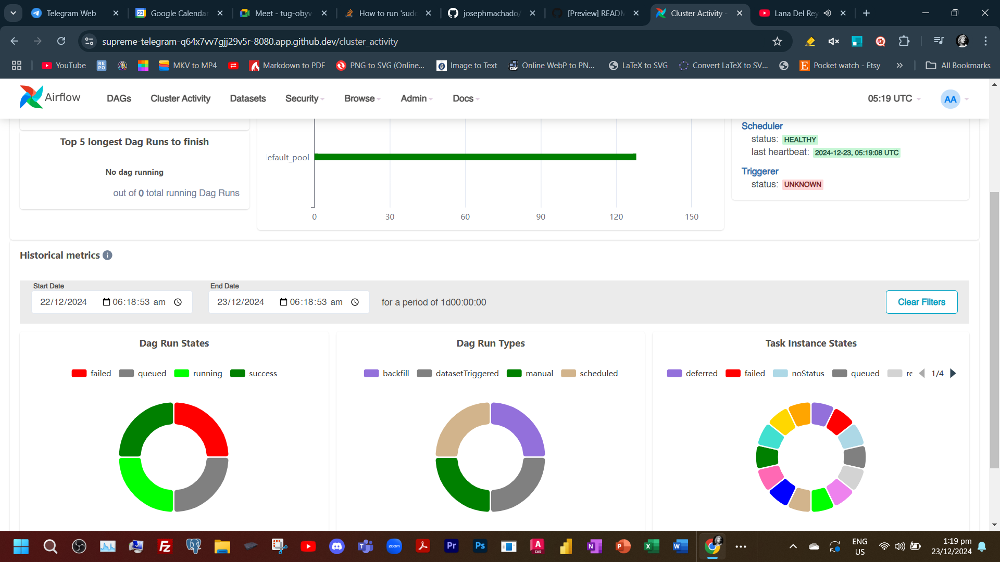

In [51]:
display(imgs[3])

# Makefiles and Docker

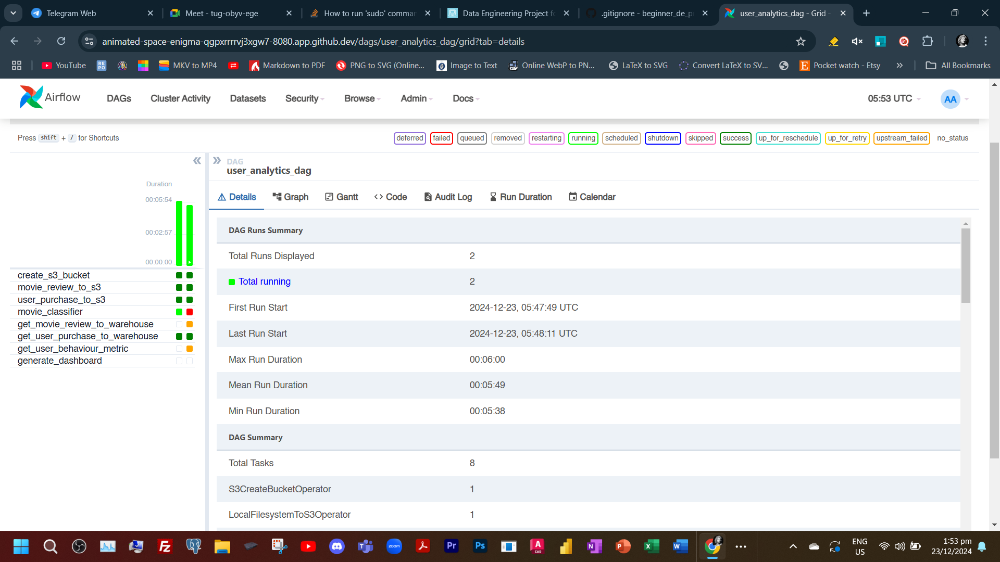

In [52]:
display(imgs[46])

#### can you describe to me what a container may look like. Is it like code which is something you also write?

You're on the right track! It's helpful to think of a container as something you build (like code), but it's more than just code. Here's a breakdown:

What a Container Is:
* A container is a lightweight, self-contained runtime environment that includes everything an application needs to run:
- Code: Your application's code (Python, Java, Node.js, etc.).
- Runtime: The necessary runtime environment (e.g., the Python interpreter, Java Virtual Machine).
- System Tools: Essential utilities and libraries (e.g., shell commands, network tools).
- System Libraries: Dependencies required by your application.
- Settings: Configuration files, environment variables, etc.

* What a Container Looks Like (Metaphorically):
Think of it like a neatly packaged box. Inside the box, you have: The software itself (your code), All the tools it needs to run (like a toolbox with a hammer, screwdriver, etc.), Instructions on how to use it (configuration files), This box is isolated from everything else on your computer. It has its own little world inside.

* How You "Write" a Container:
You don't write a container in the same way you write a Python script. Instead, you define how the container should be built using a Dockerfile.

* What is a Dockerfile? A Dockerfile is a text file that contains instructions for building a Docker image. It's like a recipe for creating your container.

* Example Dockerfile:
```
# Use a base image (like a starting point)
FROM python:3.9-slim-buster

# Set the working directory inside the container
WORKDIR /app

# Copy your application code into the container
COPY . /app

# Install dependencies
RUN pip install -r requirements.txt

# Set the command to run when the container starts
CMD ["python", "my_app.py"]
Explanation:

FROM python:3.9-slim-buster: Starts with a minimal Python 3.9 image.
WORKDIR /app: Sets the working directory inside the container.
COPY . /app: Copies your project files into the container.
RUN pip install -r requirements.txt: Installs Python dependencies.
CMD ["python", "my_app.py"]: Specifies the command to run when the container starts.
```

* Building and Running:

Build: You use the docker build command to create a Docker image from the Dockerfile.
Run: You use the docker run command to create a running container from the image.
Key Differences from Regular Code:

* Dockerfile vs. Code: A Dockerfile describes the environment in which your code runs, while your code is the actual set of instructions that perform specific tasks.
Image vs. Container: An image is like a blueprint, while a container is a running instance of that blueprint.
In summary: A container is a packaged environment that includes everything an application needs to run. You define this environment using a Dockerfile, which is a set of instructions for building a Docker image. The image is then used to create running containers. It's not code in the traditional sense, but it's a crucial part of modern software development, especially in data engineering and machine learning.

#### help me understand the makefile and its commands. How does it relate to docker? Are there commands in docker that when installed can be used in this makefile? What are containers anyway? I'm new to this because I'm trying to learn data engineering so help me understand in simple terms that could relate to me as a Machine Learning developer

Let's break down the Makefile, Docker, and containers in simple terms, relating them to your experience as a machine learning developer.

What is a Makefile?

A **Makefile is a simple text file that automates tasks (I think by running this makefile through a single command which automates all the tasks in it)**. Think of it as a script that tells your computer what to do in a specific order. It's **especially useful for complex projects with many steps**, like **setting up a development environment** or running tests.

How Does the Makefile Relate to Docker?

In your Makefile, the commands are primarily about managing Docker containers. Docker is a platform that allows you to package applications and their dependencies into standardized units called containers.

What are Containers?

**Imagine you have an ML model that requires specific versions of Python, TensorFlow, and other libraries**. Instead of installing all these dependencies directly on your machine (which can lead to conflicts with other projects), **you can put them inside a container**.

A **container** is like **a lightweight virtual machine (as opposed to a real VM which as described by fireship is quite slow)** that **contains everything your application needs to run**: **code, runtime, system tools, system libraries, settings**. It's isolated from your host machine and other containers, so there are no dependency conflicts. E.g. I have a machine learning app it needs a requirements.txt file containing all dependencies in order to subsequently install these dependencies, a conda environment with python version 3.12.3, conda itself to create the environment

If was to create an app that had node js 16 and I shipped it to another machine that had node js 14 the app might just break. To solve this we create a docker file that contains commands to build what is called an *image* an immutable replica of our app with the same dependencies, and when this is built and running this is what we call now as a container. 

Docker Commands Used in the Makefile:

docker compose build: Builds Docker images. An image is like a template for a container. It contains the application code and all its dependencies.
docker compose up: Starts Docker containers based on the images defined in a docker-compose.yml file (which is not shown in your Makefile but is implied).
docker compose down: Stops and removes Docker containers.
docker exec: Executes a command inside a running Docker container.
Example:

docker exec webserver python -m black -S --line-length 79 .

This command means:

docker exec: Execute a command inside a container.
webserver: The name of the container where the command should be executed.
python -m black -S --line-length 79 .: The command to execute inside the container (in this case, running the black code formatter).
How This Relates to You as an ML Developer:

Reproducible Environments: You can define your ML environment (Python version, libraries, etc.) in a Dockerfile, which is used to build Docker images. This ensures that everyone on your team uses the same environment, preventing "it works on my machine" issues.
Easy Deployment: You can easily deploy your ML models to different environments (development, testing, production) using Docker containers.
Simplified Dependency Management: You don't have to worry about managing dependencies on your host machine. They are all contained within the Docker container.
CI/CD: Docker integrates well with continuous integration and continuous deployment (CI/CD) pipelines, automating the build, testing, and deployment of your ML applications.
In summary: The Makefile automates common tasks related to managing your Airflow environment using Docker. Docker provides a way to package your applications and their dependencies into portable and reproducible containers. This is extremely valuable for ML development, as it simplifies dependency management, ensures reproducibility, and streamlines deployment.



As for the Makefile this appears to be for setting up and managing an Airflow environment using Docker Compose. Let's break down the sections:

1. Building and Starting Airflow:

docker-spin-up:
Builds the Airflow image using docker compose build.
Initializes the Airflow database with docker compose up airflow-init.
Starts the Airflow services in detached mode (-d) and rebuilds images if needed (--build).

2. Setting Up Permissions:

perms:
Creates directories for Airflow data using sudo mkdir.
Sets permissions for these directories using sudo chmod to allow read, write, and execute access for user, group, and others (caution advised - consider tighter permissions for production environments).

3. Initializing Connection:

setup-conn:
Runs the setup_conn.py script inside the scheduler container to potentially initialize database connections.
This script likely interacts with Airflow's connection management functionality.

4. Sleep Command (Optional):

do-sleep:
Pauses for 30 seconds using sleep.
This might be a placeholder for waiting for Airflow to initialize or for other purposes.

5. Main Commands:

up:

Calls the subcommands perms, docker-spin-up, do-sleep, and setup-conn in sequence.
This effectively starts the Airflow environment with database initialization and permission setup.
down:

Stops and removes all Airflow containers using docker compose down.
restart:

Calls down followed by up to restart the Airflow environment.
sh:

Opens a bash shell inside the Airflow webserver container for manual interaction.

6. Testing and Code Quality Checks:

pytest:

Runs unit tests for Airflow using pytest inside the webserver container.
The -p no:warnings option suppresses warnings, and -v provides verbose output.
format:

Formats Python code using black inside the webserver container.
The -S flag enables style checks and --line-length 79 sets the maximum line length.
isort:

Sorts Python imports using isort inside the webserver container.
type:

Performs type checking using mypy inside the webserver container.
The --ignore-missing-imports flag ignores missing imports for flexibility.
lint:

Runs code linting using flake8 inside the webserver container.
This likely checks for style and syntax errors in Python code within the /opt/airflow/dags directory.
ci:

A target command that likely executes all the code quality checks in sequence: isort, format, type, lint, and pytest.
This is potentially used in a continuous integration (CI) pipeline to ensure code quality during development.
Overall, this Makefile provides a convenient way to manage the Airflow environment using Docker Compose, including configuration, startup, testing, and code quality checks.

Important Note:

The perms command sets very permissive file system permissions. In a production environment, you should consider tightening these permissions for security reasons.

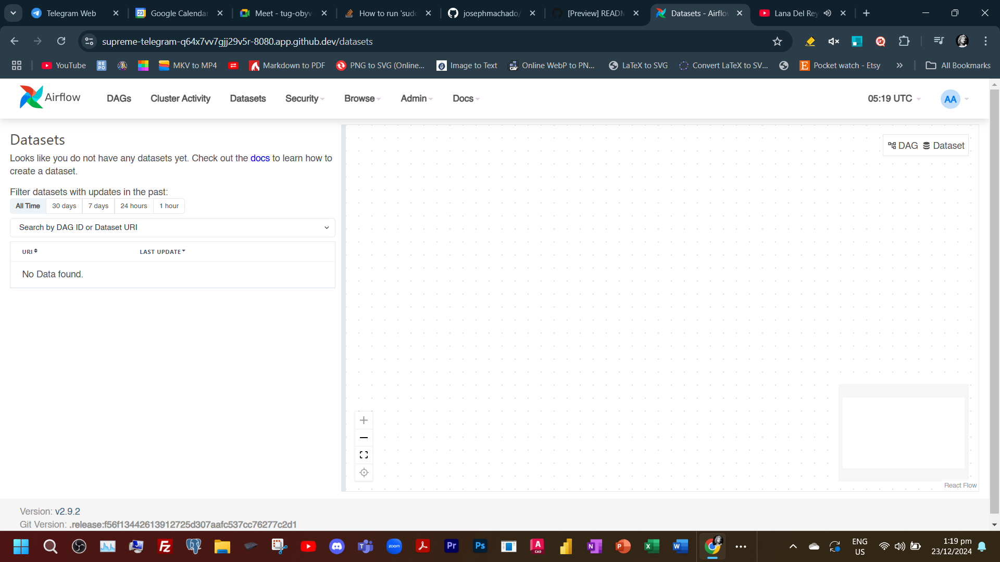

In [53]:
display(imgs[4])

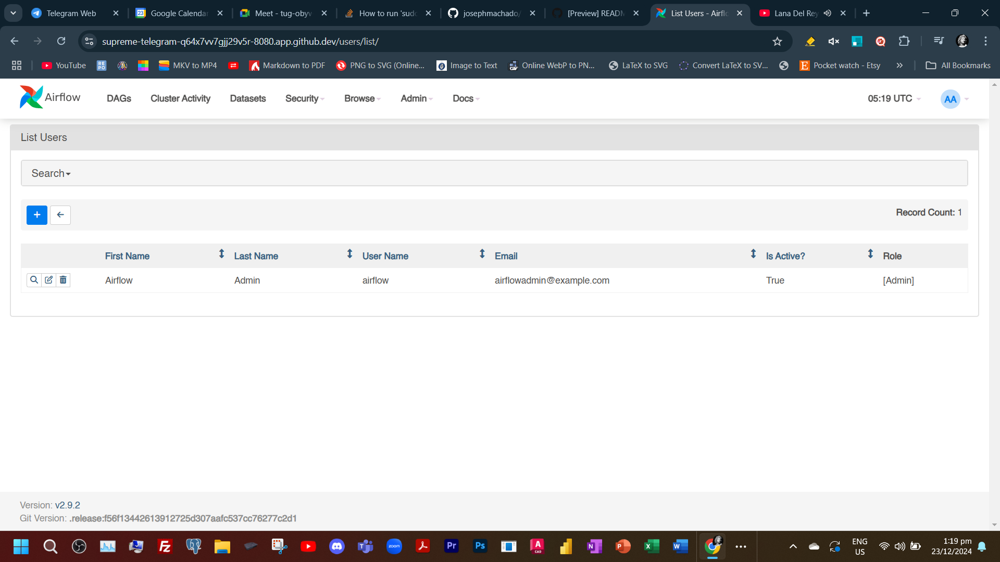

In [54]:
display(imgs[5])

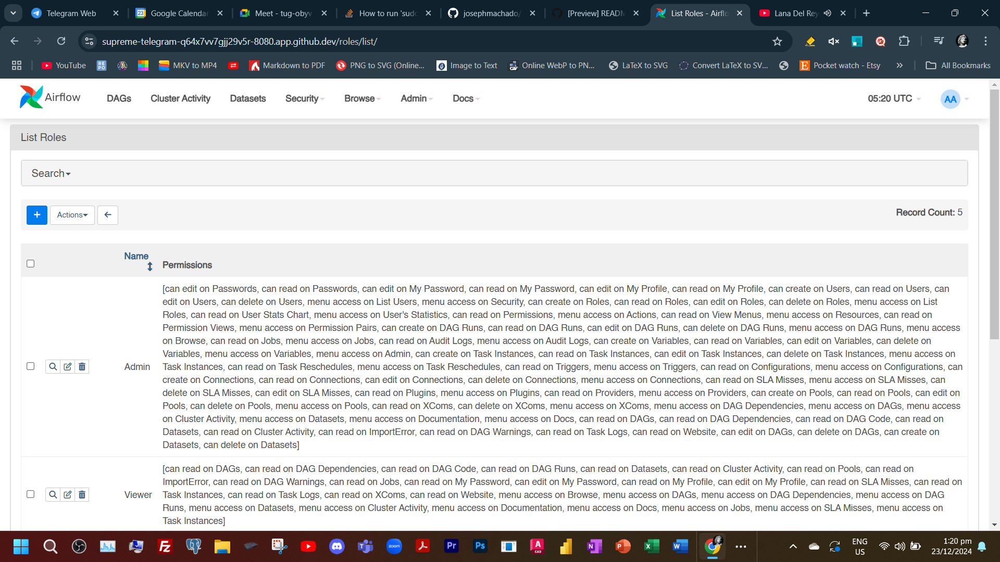

In [55]:
display(imgs[6])

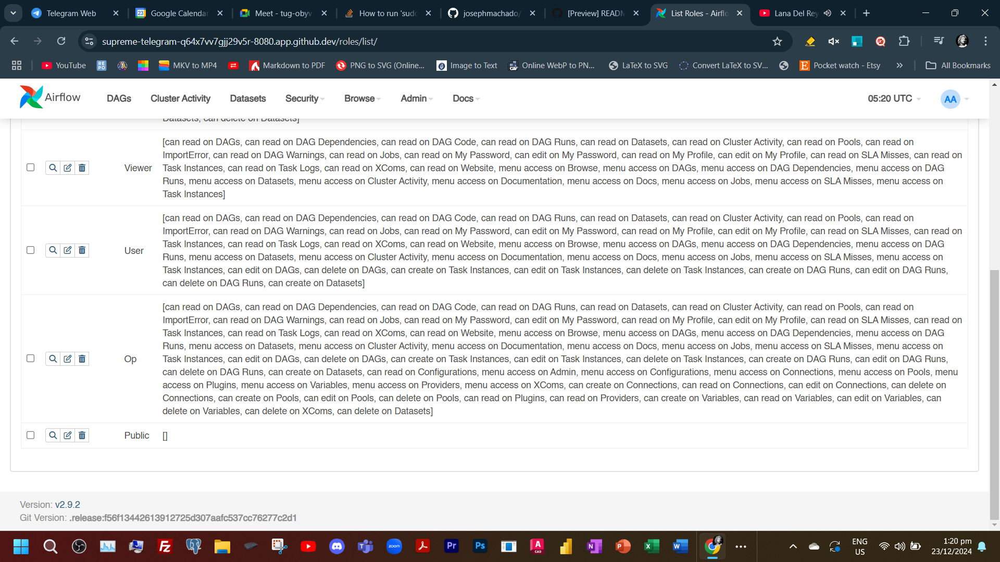

In [56]:
display(imgs[7])

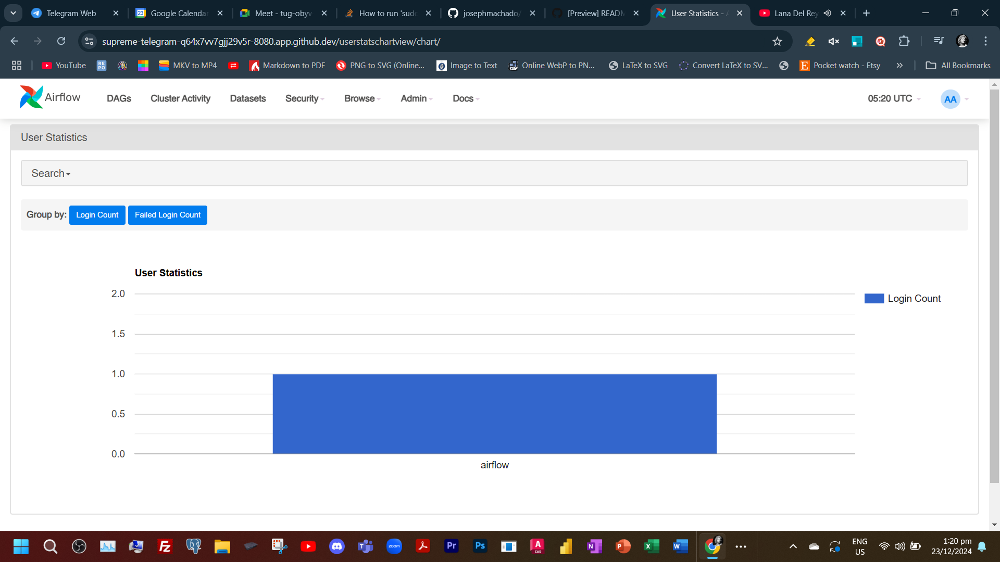

In [57]:
display(imgs[8])

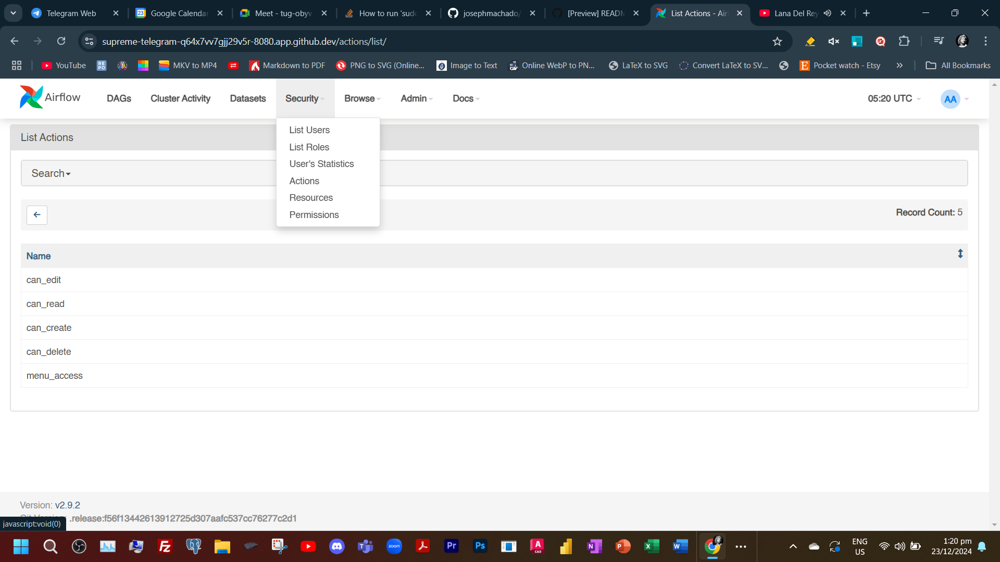

In [58]:
display(imgs[9])

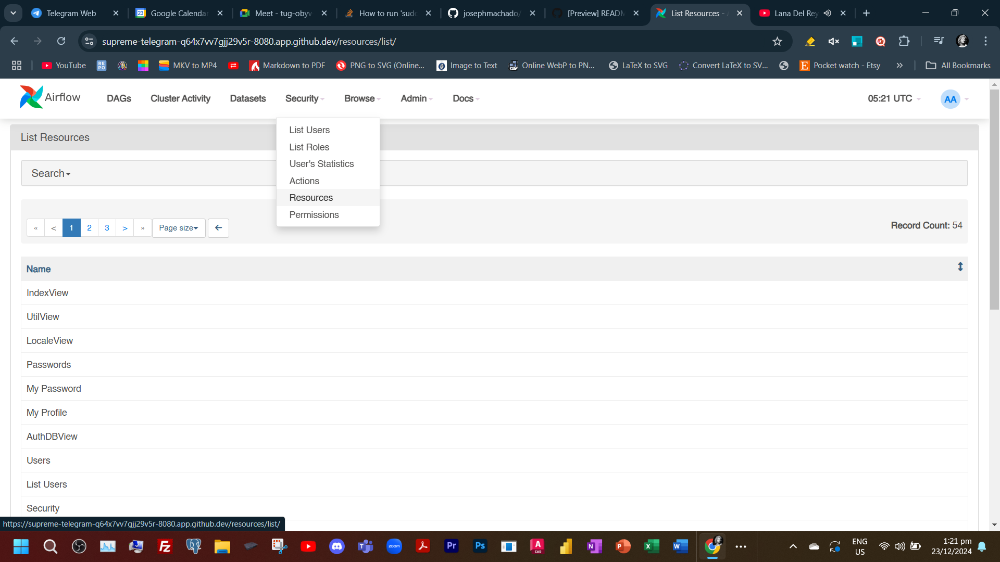

In [59]:
display(imgs[10])

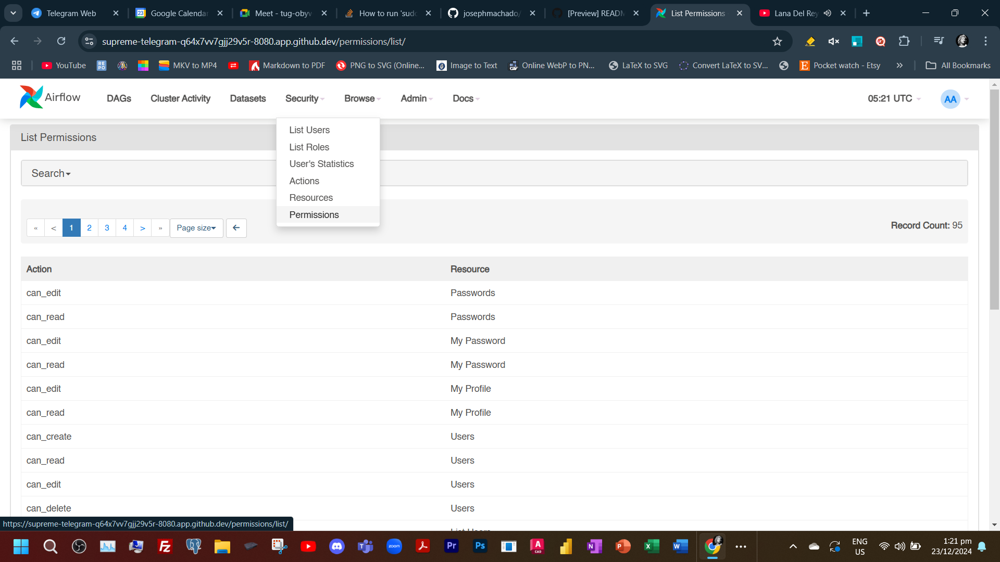

In [60]:
display(imgs[11])

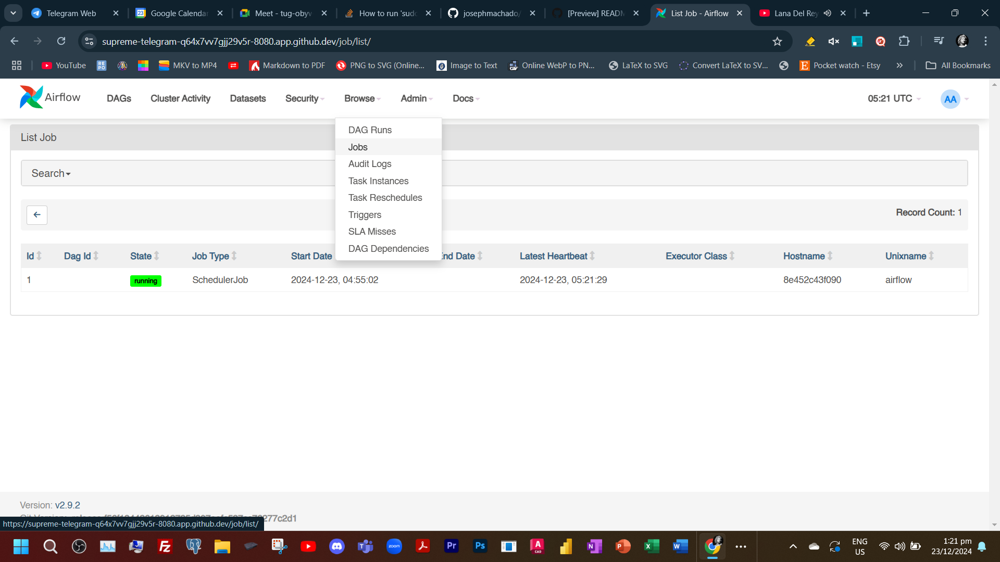

In [61]:
display(imgs[12])

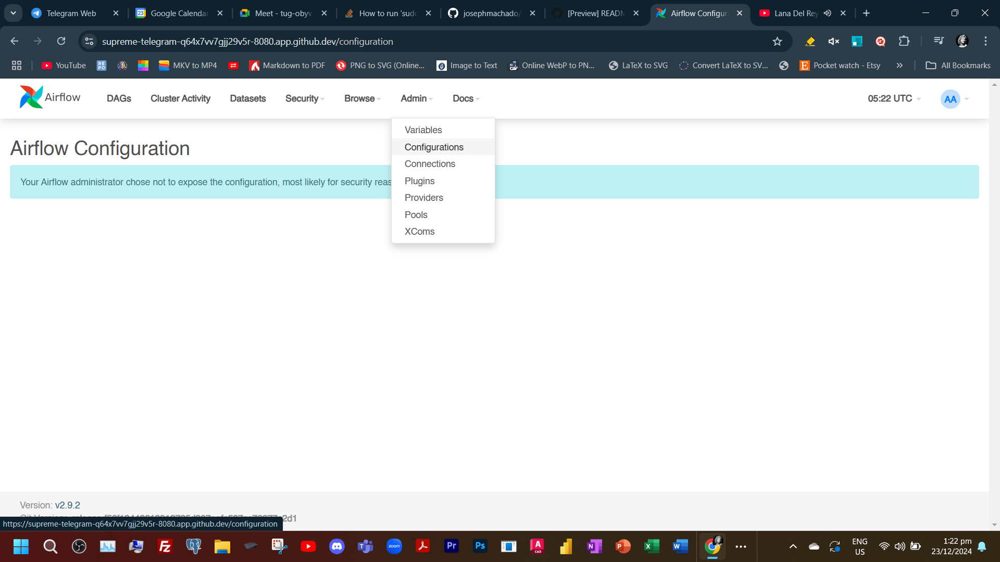

In [62]:
display(imgs[13])

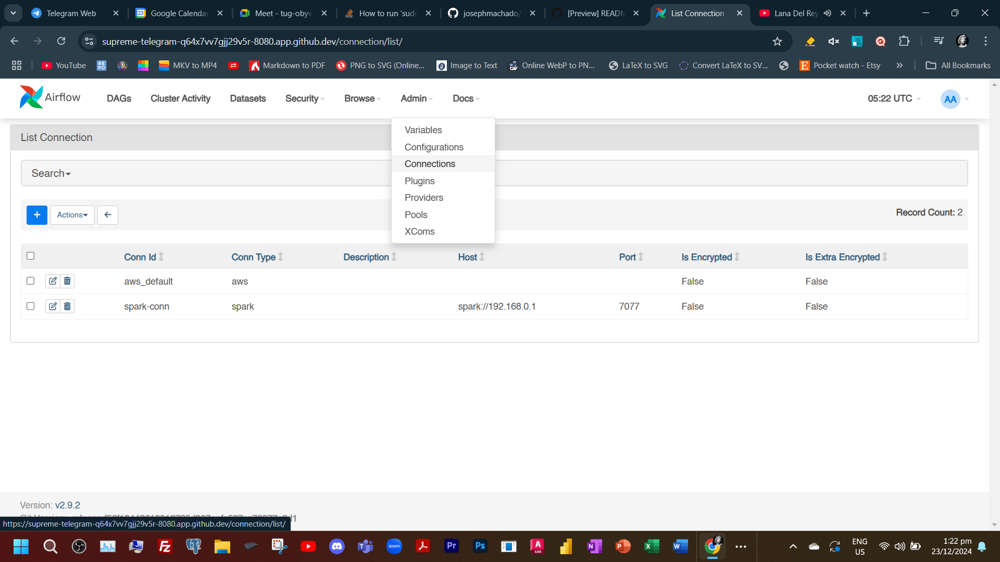

In [63]:
display(imgs[14])

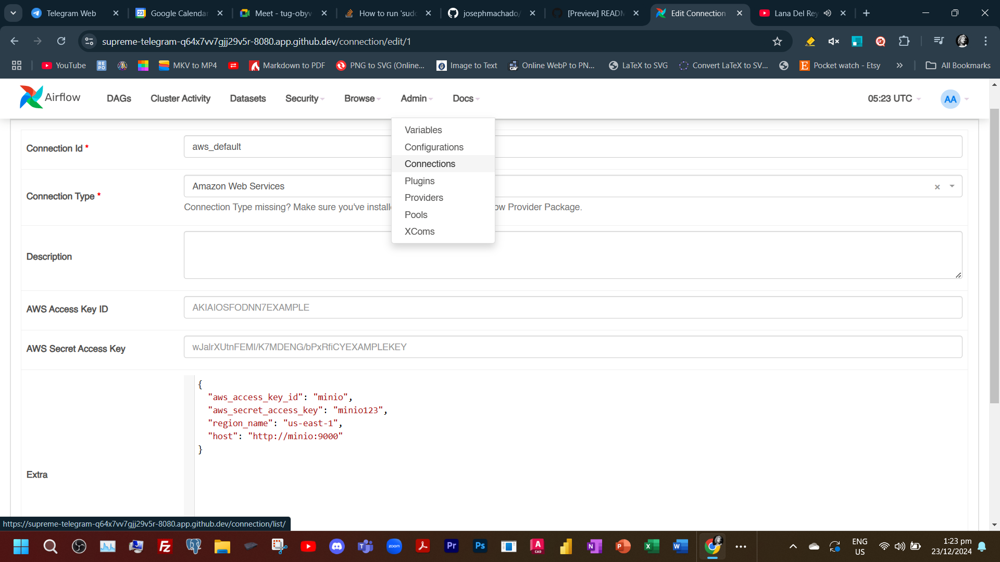

In [64]:
display(imgs[15])

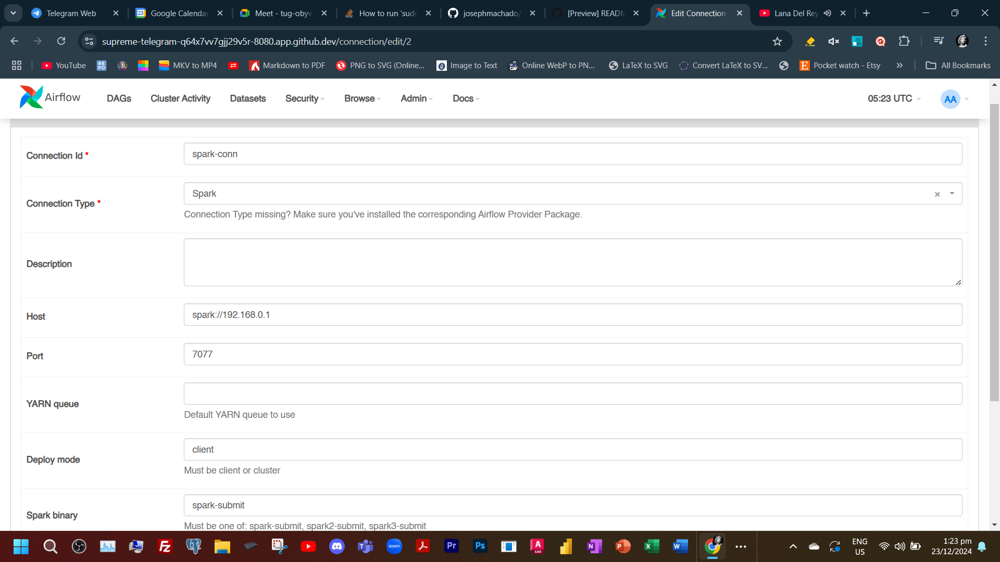

In [65]:
display(imgs[16])

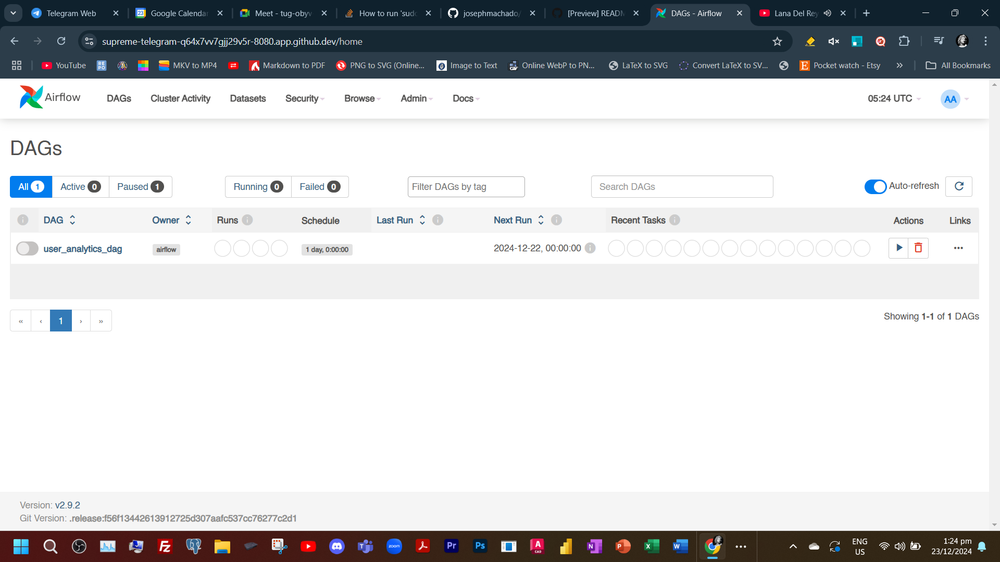

In [66]:
display(imgs[17])

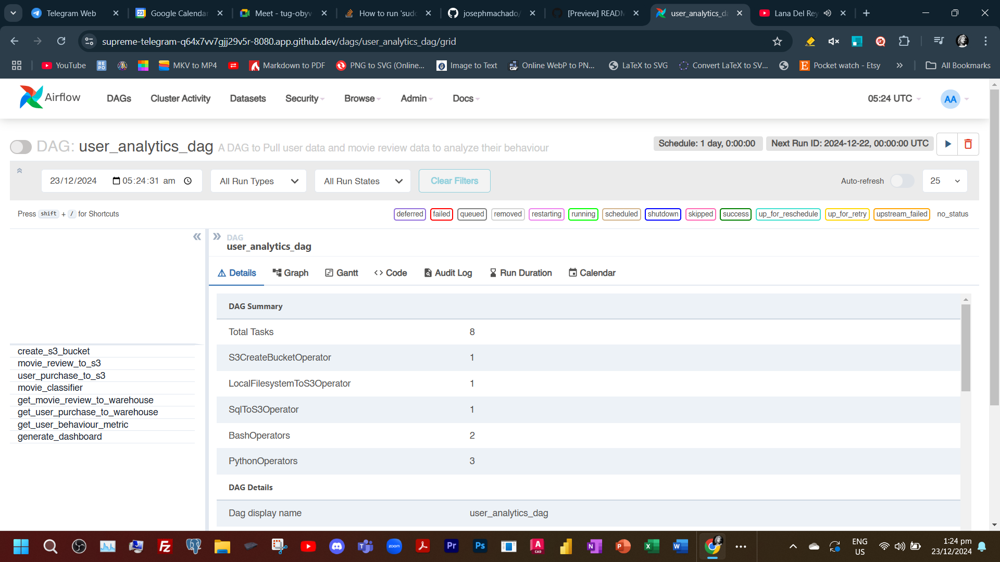

In [67]:
display(imgs[18])

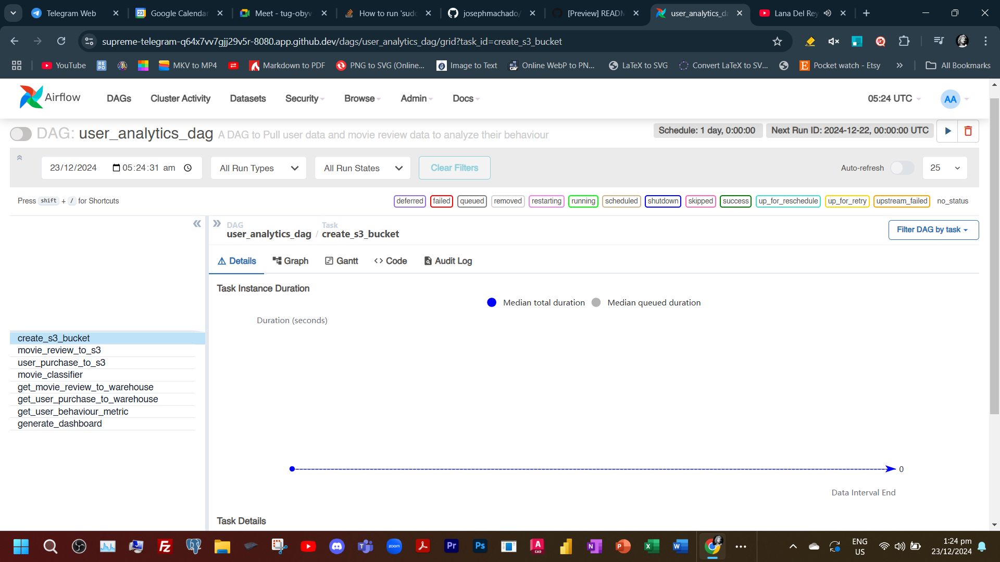

In [68]:
display(imgs[19])

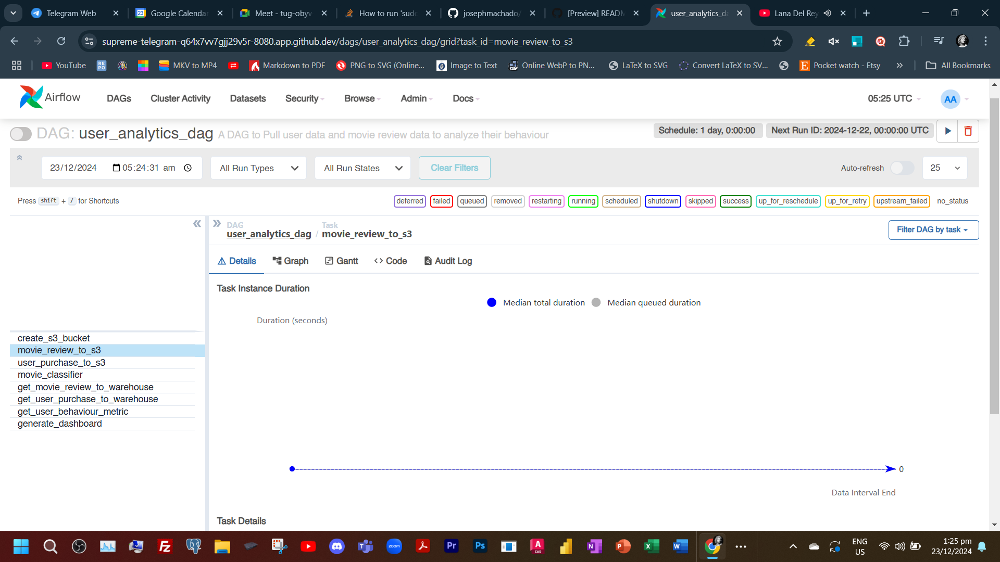

In [69]:
display(imgs[20])

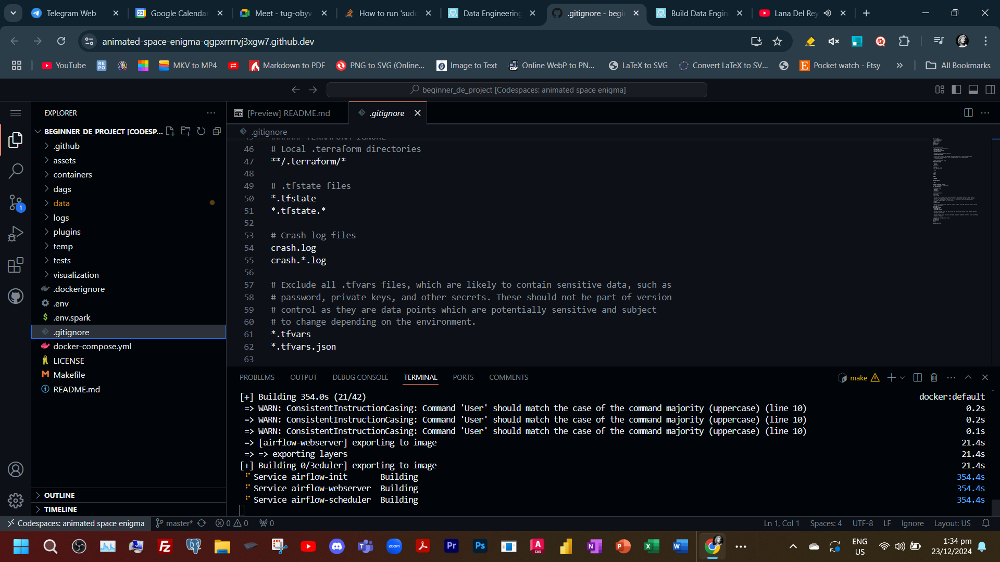

In [70]:
display(imgs[21])

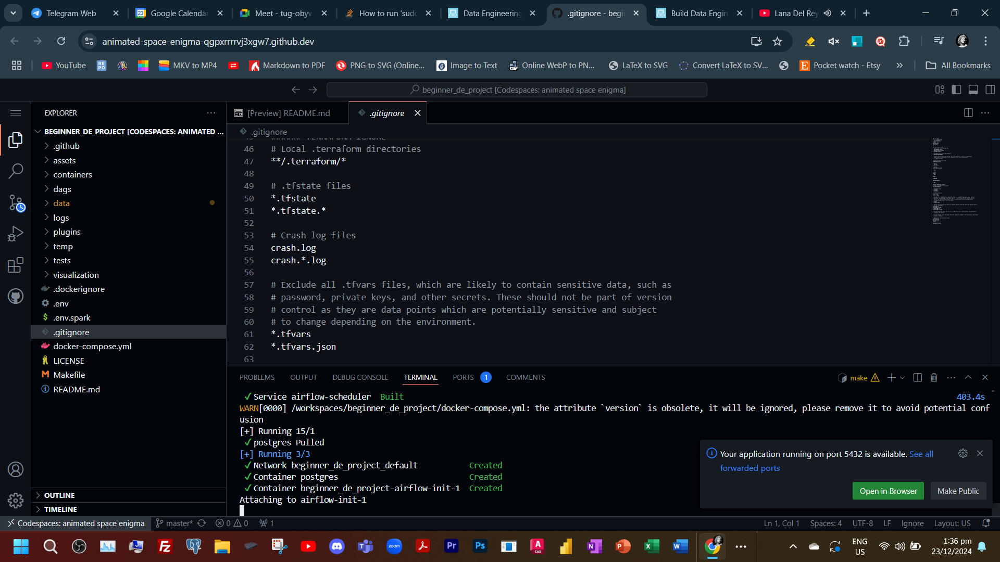

In [71]:
display(imgs[22])

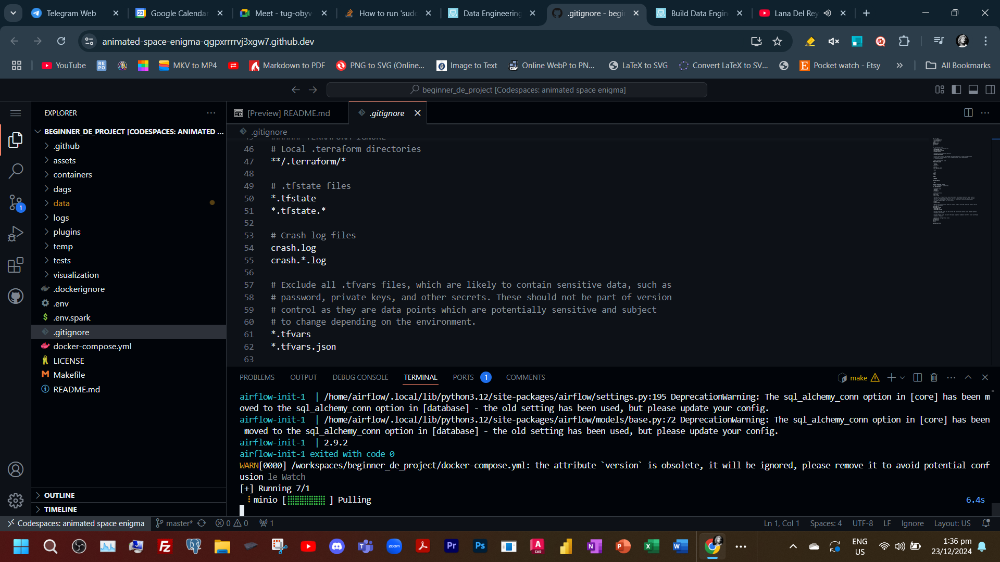

In [72]:
display(imgs[23])

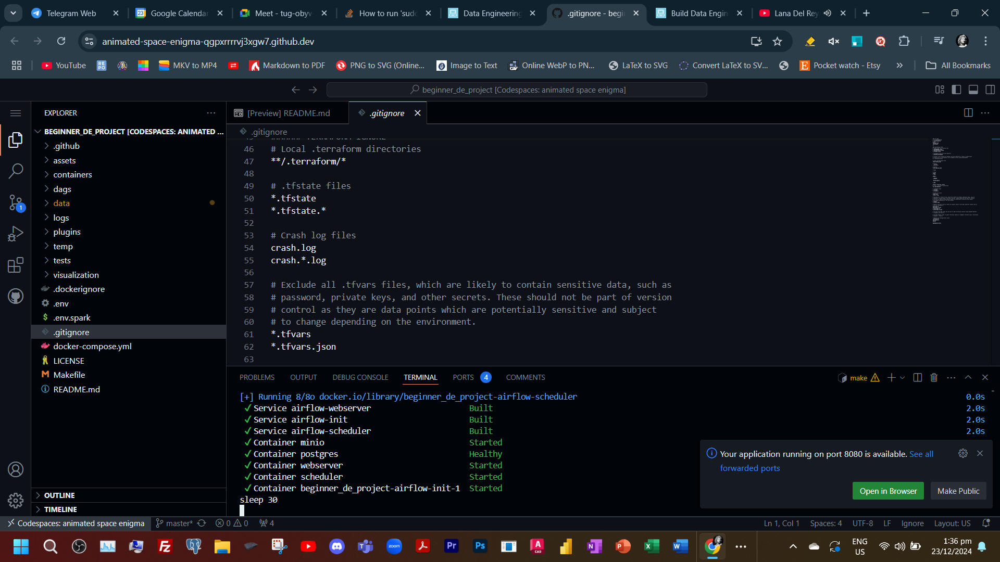

In [73]:
display(imgs[24])

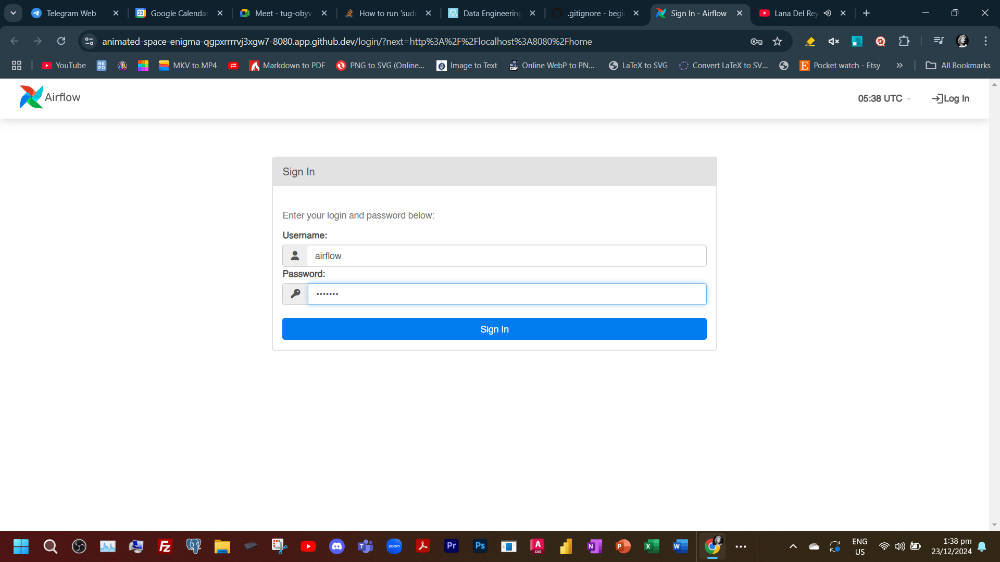

In [74]:
display(imgs[25])

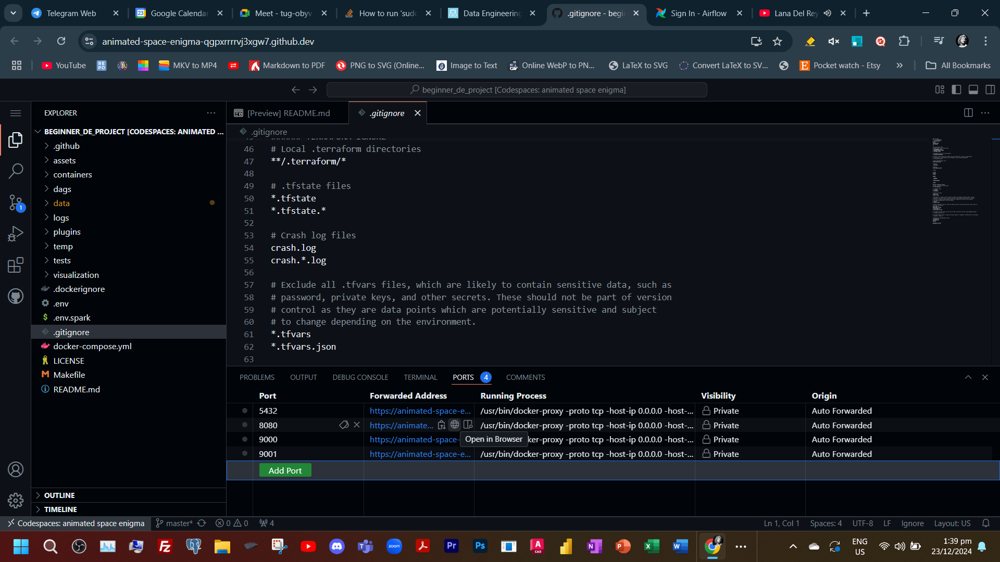

In [75]:
display(imgs[26])

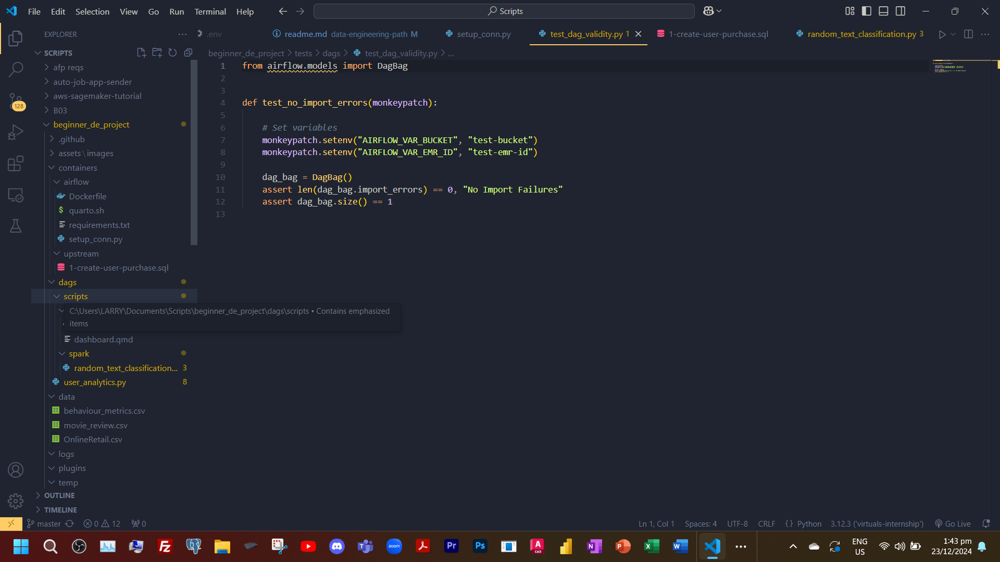

In [76]:
display(imgs[27])

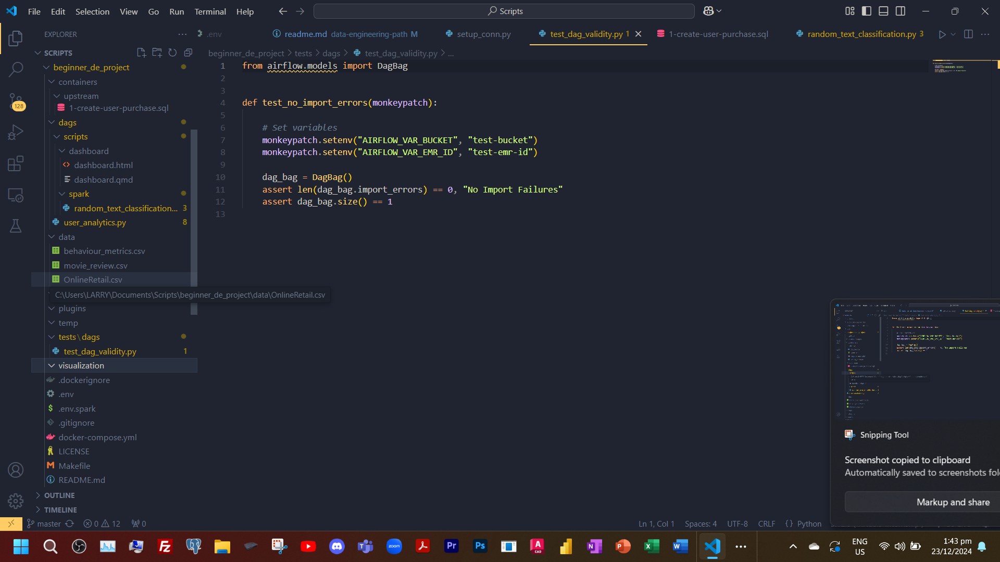

In [77]:
display(imgs[28])

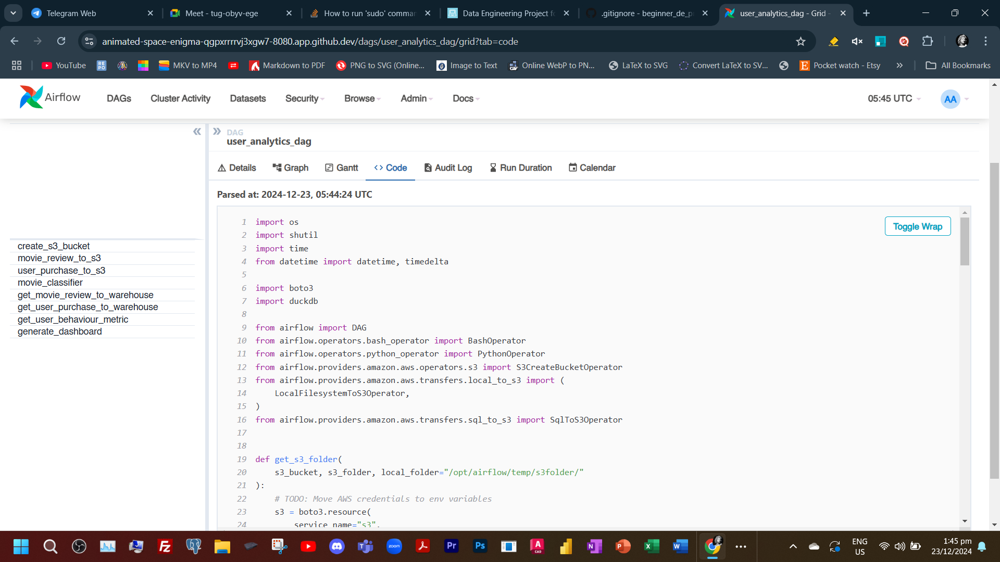

In [78]:
display(imgs[29])

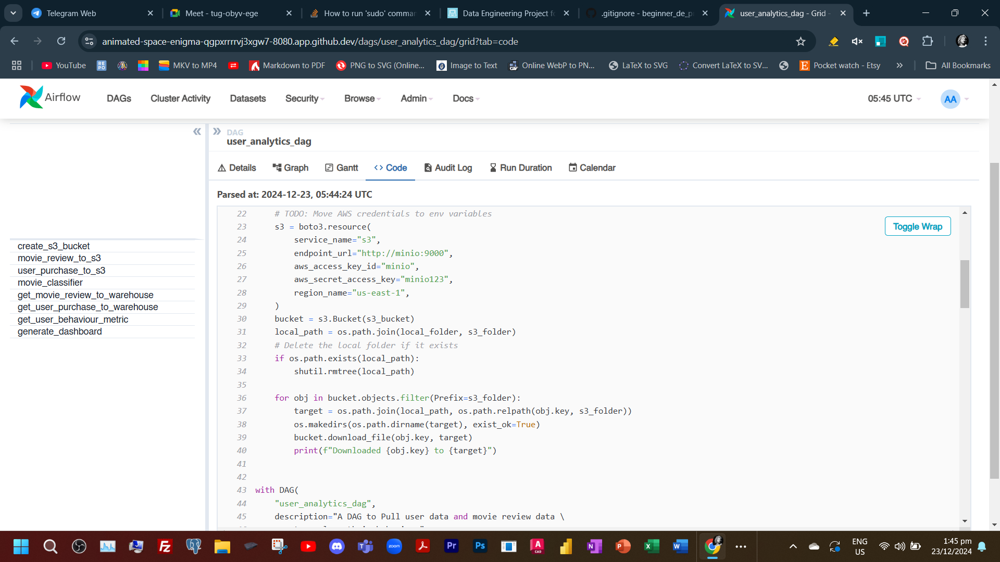

In [79]:
display(imgs[30])

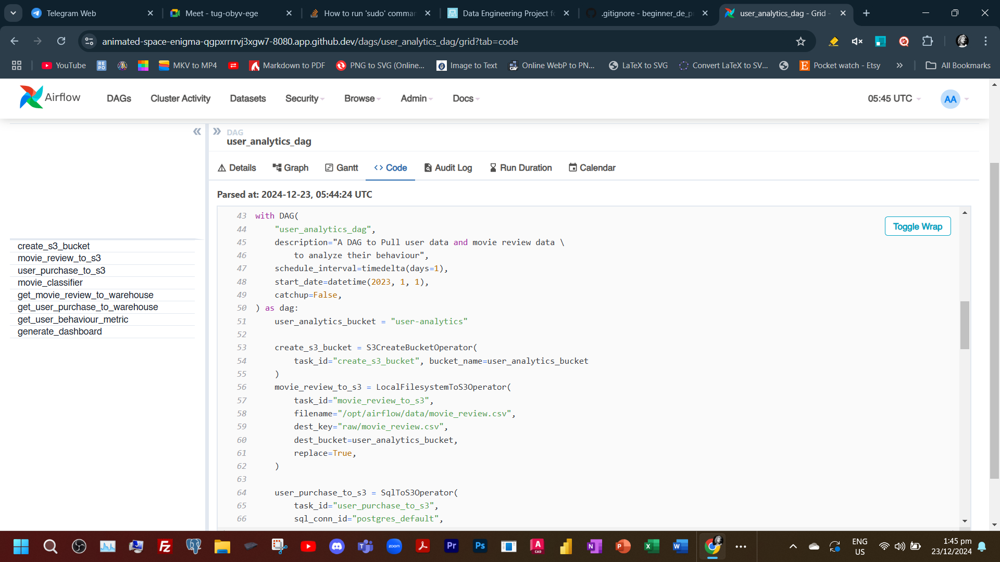

In [80]:
display(imgs[31])

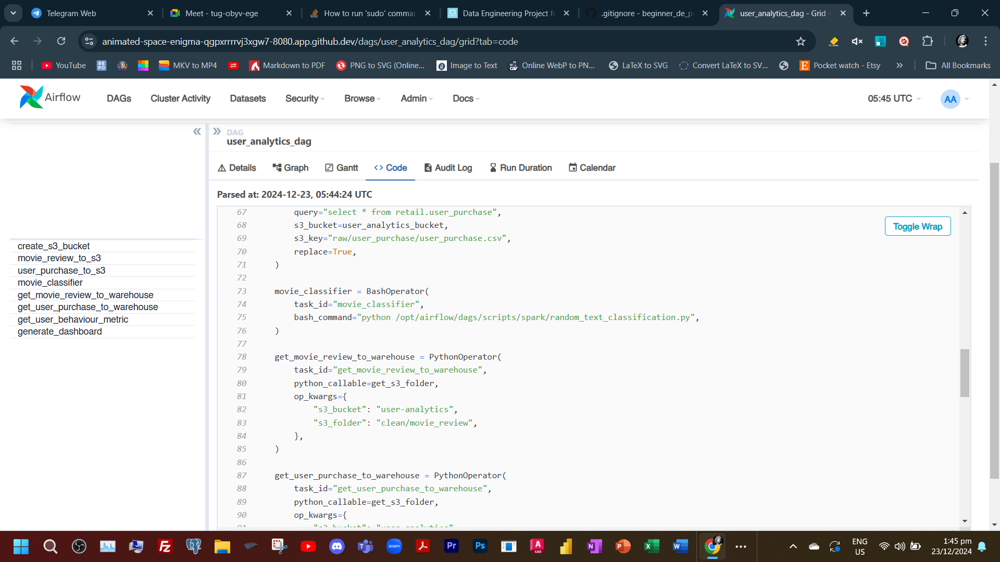

In [81]:
display(imgs[32])

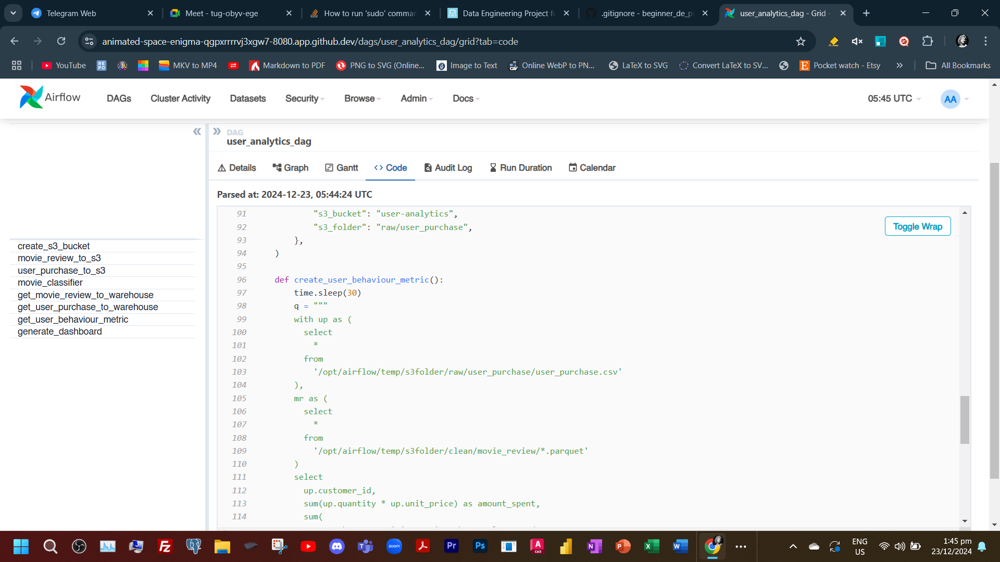

In [82]:
display(imgs[33])

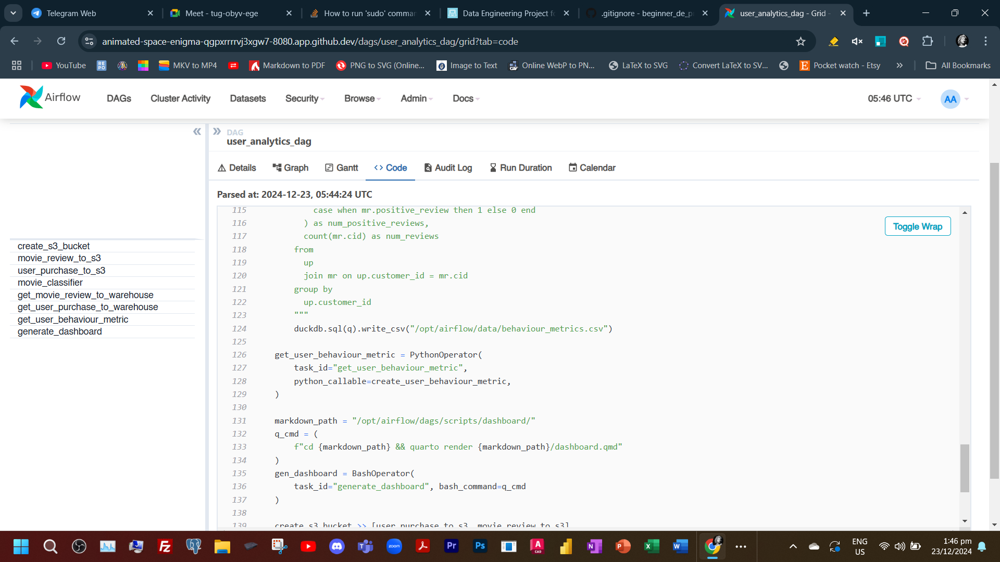

In [83]:
display(imgs[34])

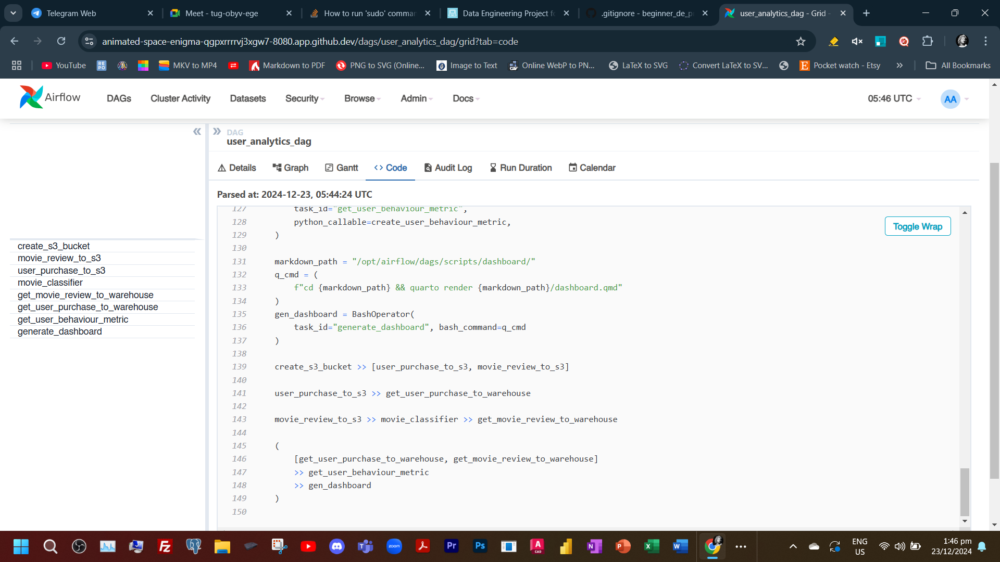

In [84]:
display(imgs[35])

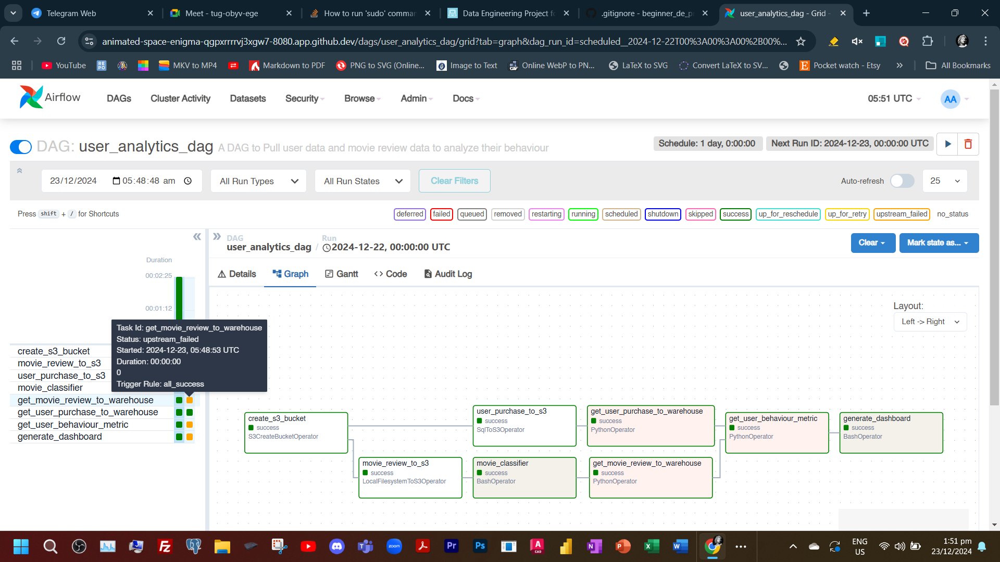

In [85]:
display(imgs[42])

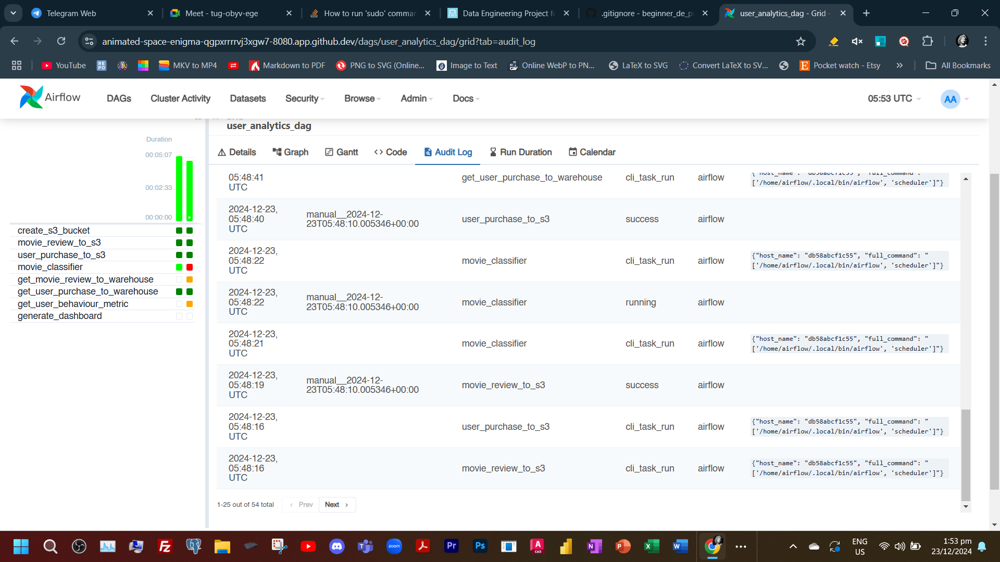

In [86]:
display(imgs[43])

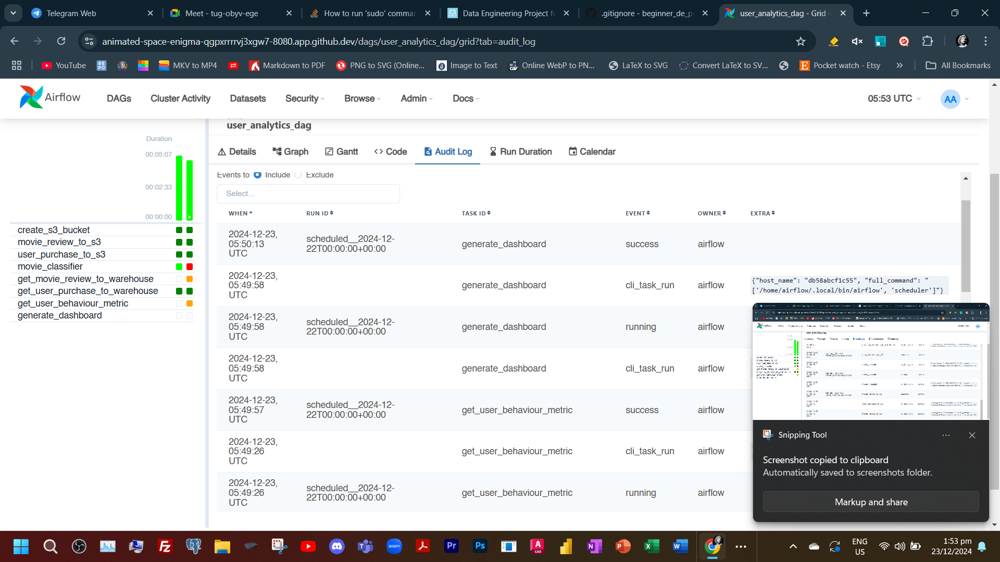

In [87]:
display(imgs[44])

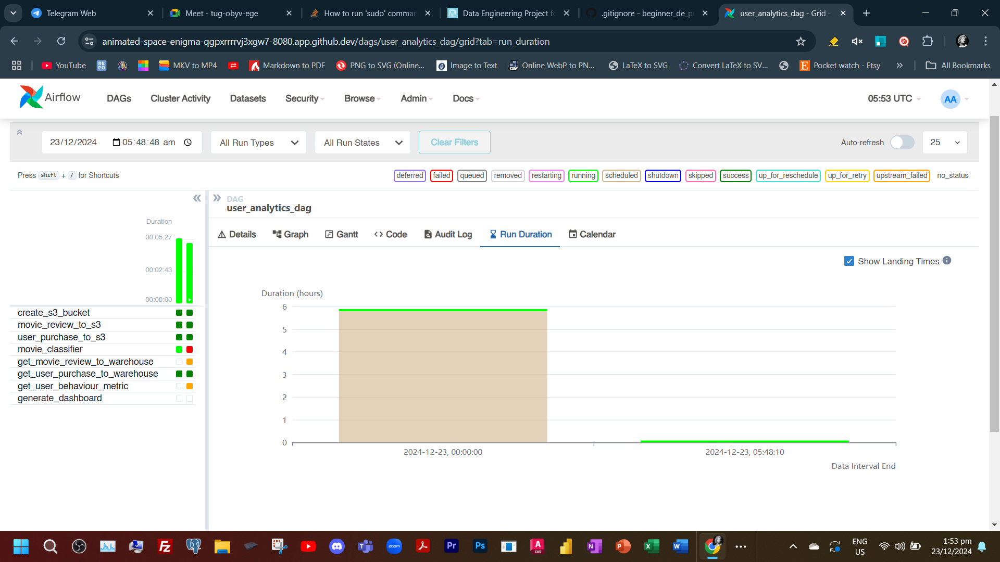

In [88]:
display(imgs[45])

# I'm really trying to learn data engineering now

# So far I've learned the basics of sql python and doing everything locally.

# My guess is the use of tools like airflow for data orchestration, snowflake, aws s3 and ec2 instances or any cloud playform that provides these services like azure or gcp, redshift, databricks, docker, etc. are all used in such a way that we don't have to do everything locally and manually anymore as these tools provide automated data pipelines to update perhaps visualization when new data is fed into the system and so that it can be used by all as opposed to running everything locally. Please do correct my understanding and list a more refined and more comprehensive wya of describing these tools manner

Your understanding of the role of these tools in data engineering is generally correct! Here's a more refined and comprehensive way of describing them:

1. Moving Beyond Local Development:

Scalability and Performance: Local environments are limited by your machine's resources. Cloud platforms (AWS, Azure, GCP) offer scalable infrastructure (EC2 instances, virtual machines) and high-performance computing resources (like GPUs) to handle large datasets and complex processing.
Data Storage and Retrieval: Cloud object storage (AWS S3, Azure Blob Storage, GCP Cloud Storage) provides cost-effective and scalable storage for massive datasets. Data warehouses like Snowflake and Redshift offer powerful query engines for fast data analysis.
Data Integration and Orchestration: Tools like Apache Airflow, Prefect, and Luigi orchestrate complex data pipelines, scheduling tasks, managing dependencies, and monitoring execution. They automate the movement of data between different sources and destinations.
2. Collaborative Data Pipelines:

Teamwork and Collaboration: Cloud platforms enable teams to collaborate effectively on data projects. Tools like Databricks provide a collaborative workspace for data scientists and engineers to work together on data pipelines and analysis.
Data Sharing and Access Control: Cloud platforms offer robust security and access control mechanisms to ensure data privacy and security. You can easily share data with authorized users and teams within your organization.
3. Modern Data Engineering Practices:

Containerization (Docker): Docker allows you to package your code and dependencies into containers, ensuring consistency and portability across different environments.
Data Lakehouses (Databricks): These platforms combine the best of data lakes (raw, unstructured data) and data warehouses (structured, analytical data) to provide a unified platform for data engineering and analysis.
Serverless Computing: Services like AWS Lambda and Azure Functions allow you to run code without managing servers, reducing operational overhead and costs.
In Summary:

Data engineering in the cloud involves leveraging a suite of tools to build and maintain robust, scalable, and efficient data pipelines. These tools automate data movement, processing, and analysis, enabling data teams to focus on higher-value tasks like data exploration, model building, and business insights.

Key Takeaways:

Cloud platforms provide the infrastructure and scalability needed for modern data engineering.
Tools like Airflow orchestrate and manage data pipelines.
Data warehouses and data lakes provide efficient data storage and retrieval.
Containerization and serverless computing enhance flexibility and efficiency.
I hope this provides a clearer understanding of how these tools fit into the broader context of data engineering!

# So if I was to build a data engineering project, you must act as a professional data engineer and determine the ptotential tools to use for each step of the pipeline e.g. Step 1 (data extraction): python, selenium --> step 2 (data preprocessing): pandas, sql, --> and so on...

Okay, I'm happy to put on my data engineer hat! Let's say we're building a data pipeline to analyze customer sentiment from social media platforms (Twitter, Facebook, Instagram). Here's a potential tool stack for each step:

1. Data Extraction:

Twitter API: For structured data extraction (tweets, user profiles).
Facebook Graph API: For extracting data from Facebook pages and user interactions.
Instagram API: For accessing public Instagram data (limited).
Selenium: For web scraping dynamic content from social media platforms (if APIs are insufficient).
Apache Kafka: For real-time data streaming from various sources.
2. Data Transformation/Preprocessing:

Python (with libraries like Pandas, NumPy): For data cleaning, transformation, feature engineering (e.g., sentiment analysis using libraries like TextBlob, VADER).
Spark: For large-scale data processing and transformations, especially for big data scenarios.
SQL (using databases like PostgreSQL, MySQL): For data cleaning, transformation, and aggregation.
3. Data Loading/Storage:

Cloud Storage (AWS S3, Azure Blob Storage, GCP Cloud Storage): For storing raw and processed data.
Data Warehouses (Snowflake, Redshift, BigQuery): For storing structured data for analytical queries.
Data Lakes (AWS S3, Azure Data Lake Storage): For storing raw and unstructured data.
4. Data Orchestration:

Apache Airflow: For scheduling and managing the entire data pipeline, handling dependencies, and monitoring execution.
Prefect: A modern workflow orchestration platform with a user-friendly interface.
Luigi: A Python-based workflow system.
5. Data Quality & Monitoring:

Great Expectations: For defining and enforcing data quality checks throughout the pipeline.
Data observability platforms (e.g., Monte Carlo, Datafold): For monitoring data quality and detecting anomalies in real-time.
6. Data Analysis & Visualization:

Business Intelligence tools (Tableau, Power BI, Looker): For creating interactive dashboards and visualizations.
Python libraries (Matplotlib, Seaborn): For data exploration and visualization.
Jupyter Notebooks: For interactive data analysis and prototyping.
Note:

This is just a sample pipeline and the specific tools used will vary depending on the specific requirements of your project.
Consider factors like budget, team expertise, and the scale of your data when selecting tools.
Cloud platforms offer managed services for many of these tools, simplifying deployment and management.
I hope this provides a good starting point for your data engineering project! Let me know if you have any specific questions or want to explore a particular step in more detail.

# And all of these I assume in these steps could be done programmatically using iython, and when I want to run the whole pipeline I can just run a script that runs it or perhaps have a UI hosted locally to run it,

# Bevause in my understanding libraries or sdks could be installed in the environment our script will run on and be able to communicate to these apps like aws, airflow, snowflake, in order to programmatically do the steps in each pipeline like perhaps storage, connecting to an instance, preprocessing a dataset and then loading it to a cloud database, things Like that. So again refine my understanding if it's still lacking

You're absolutely right!

Here's a refinement of your understanding:

Programmatic Control:

Jupyter Notebooks: Excellent for exploratory data analysis, prototyping, and developing and testing individual components of your pipeline.
Python Scripts: The primary way to define and execute your data pipelines. You can use Python to interact with all the tools mentioned earlier:
Connect to databases: Use libraries like psycopg2 (PostgreSQL), mysql-connector-python (MySQL), and snowflake-connector-python to interact with your databases.
Interact with cloud services: Utilize AWS SDK for Python (boto3), Azure SDK for Python, or Google Cloud Python libraries to interact with cloud services like S3, EC2, and Airflow.
Orchestrate workflows: Define and execute Airflow DAGs programmatically using the Python API.
Running the Pipeline:

Scripts: Create a Python script that orchestrates the entire pipeline, calling the necessary functions for data extraction, transformation, loading, and any other steps.
Command-line Interface (CLI): Package your script into a command-line tool for easy execution from the terminal.
Scheduling: Use a task scheduler (like cron on Linux or Task Scheduler on Windows) to schedule your pipeline to run periodically (e.g., daily, hourly).
Workflow Orchestrators: Airflow itself provides a web interface for monitoring and triggering workflows.
UI for Running Pipelines:

Streamlit, Flask, or Dash: You can build a simple web application using these libraries to provide a user interface for:
Triggering pipeline runs.
Monitoring pipeline progress and status.
Viewing pipeline logs and metrics.
Configuring pipeline parameters.
Key Considerations:

Version Control: Use Git (or a similar tool) to track changes to your code, ensuring reproducibility and enabling collaboration.
Testing: Implement unit tests and integration tests to ensure the reliability of your pipeline components.
Documentation: Document your pipeline thoroughly, including data sources, transformations, and any assumptions.
By combining programmatic control with tools like Airflow and cloud services, you can build robust, scalable, and maintainable data pipelines that automate data movement, processing, and analysis.

I hope this further clarifies your understanding!

# Snowflake

![snowflake free tier.png](<attachment:snowflake free tier.png>)
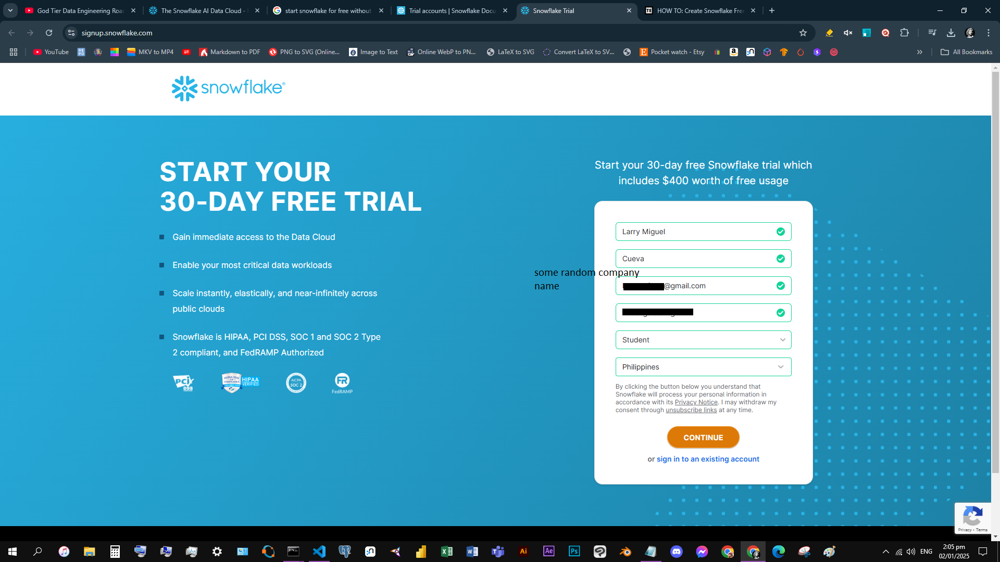

# here you'll be asked what cloud provider you use namely aws, azure, and gcp. Just pick anything you are accustomed with already in my case I've already used aws and I'm quite familiar with their servcies so that's what I use. The location can be whatever location you used last time when you used aws services i.e. US East (Virginia)

Snowflake beginner youtube course:
* https://www.youtube.com/watch?v=AR88dZG-hwo&list=PLba2xJ7yxHB7SWc4Sm-Sp3uGN74ulI4pS&index=1

Useful docs for snowflake (strictly for supplementary purposes, you should never use this as a course use youtube insteadbecause you'll just be overwhelmed by the amount of things you willl have to learn and you'll end up learning nothing; you'll be pulled into many directions and topics and end up doing nothing)
* tutorial docs on snowflake usage: https://docs.snowflake.com/en/user-guide-intro
* guides: https://docs.snowflake.com/en/guides
* developer API: https://docs.snowflake.com/en/developer

## Insights:
Step 1 Extraction:
- done by python, selenium, beautiful soup
Step 2 Cleaning/Preprocessing:
- done by python, pandas, numpy
Step 3 Data Warehousing
- done by snowflake
- di siya tulad ng ibang services where kahit walang laman yung storage or walang ginagawa sa compute service ay binabayaran mo pa rin. With snowflake payment comes with use of storage not idleness
- virtual warehouses used in compute service of snowflake
- compute services are what run your sql queries that transform your loaded cleaned/preprocessed data 
- cluster of nodes refer to multiple physical buses located somewhere, these buses contain nodes a group of CPUs or GPUs
- if you need to have more computing power you can edit the number of nodes you use
- a connector in snowflake is an external software you use to use snowflake itself outside of its own UI. E.g. python library that is dedicated to programmatically using snowflake

Other notes
- Apache Spark is a distributed system. Its main competitor is Apache Hadoop
- redshift is a service under AWS that uses sql for big data processing equivalent to GCPs big query
-If nakagawa nako ng account and sign up for a RDS instance I can use the instances details like host name, password to get, insert, update, delete rows to it.
- AWS redshift is another db service other than RDS
- RedShift supports data warehouse and data lake approaches, enabling it to access and analyze large amounts of data
- pretty much every tool e.g. snowflake, apache spark, apache airflow (for data orchestration/pipeline steps organizer), aws redshift and rds, can interface with python to programmatically operate on different steps of a data pipeline via their respective libraries e.g. 
1. PySpark - a Python API for Apache Spark. It enables you to perform real-time, large-scale data processing in a distributed environment using Python
2. Snowflake - The Snowflake Connector for Python provides an interface for developing Python applications that can connect to Snowflake and perform all standard operations. It provides a programming alternative to developing applications in Java or C/C++ using the Snowflake JDBC or ODBC drivers.
3. Apache Airflow -  is a platform to programmatically author, schedule, and monitor workflows. Directly interfaces with python such that we can programmatically authorm schedule, and monitor these workflows via a python script
4. AWS redshift - 
```
#Connect to the cluster
>>> import redshift_connector
>>> conn = redshift_connector.connect(
     host='examplecluster.abc123xyz789.us-west-1.redshift.amazonaws.com',
     database='dev',
     port=5439,
     user='awsuser',
     password='my_password'
  )
  
# Create a Cursor object
>>> cursor = conn.cursor()

# Query a table using the Cursor
>>> cursor.execute("select * from book")
                
#Retrieve the query result set
>>> result: tuple = cursor.fetchall()
>>> print(result)
>> (['One Hundred Years of Solitude', 'Gabriel García Márquez'], ['A Brief History of Time', 'Stephen Hawking'])
```
- basically in the grand scheme of things everything is done not locally anymore and is done on the cloud so that everyone can access the apps you create. **Data warehousing and managing data is done by Snowflake on top of cloud service providers like AWS, Airflow is a way to organize, oversee, and manage the steps involved in the whole data pipeline right from extracting, scraping, cleaning, warehousing, storing, to loading, transforming the data that may be used in machine learning, data analytics etc.**
- python connector for snowlake docs
1. https://docs.snowflake.com/en/developer-guide/python-connector/python-connector-install
2. https://docs.snowflake.com/en/developer-guide/python-connector/python-connector-install 
- Open Database Connectivity (ODBC) and Java Database Connectivity (JDBC) are standards for drivers that enable programmers to write database-agnostic software applications.

# Airflow


Airflow beginner youtube course:
* https://www.youtube.com/watch?v=K9AnJ9_ZAXE&list=PLCBT00GZN_SDHeobbIuCFG-_XMRgRbQ5l&index=1&t=143s&pp=gAQBiAQB

Useful docs for airflow:
* https://airflow.apache.org/docs/apache-airflow/stable/start.html
* https://airflow.apache.org/docs/apache-airflow/stable/installation/index.html
* https://airflow.apache.org/docs/apache-airflow/stable/tutorial/index.html 

# AWS

# Apache Spark

Apache spark beginner youtube course:
* https://www.youtube.com/playlist?list=PL6UwySlcwEYKiC-EjEmN4f33c5fVpbzha

useful docs on Apache spark
* 

# Apache Kafka